In [1]:
import sys

sys.path.append("./scripts/")

In [3]:
from data_manager import DataManager
dm = DataManager(source="huggingface", data_dir=None)

In [4]:
plot_config_grid = [
        {'name': 'Mess3', 'gt_run': ("20241205175736", 23), 
         'models': [("Transformer", ("20241205175736", 23)), ("LSTM", ("20241121152808", 55))]},
        {'name': 'TomQA', 'gt_run': ("20241205175736", 17), 
         'models': [("Transformer", ("20241205175736", 17)), ("LSTM", ("20241121152808", 49))]},
        {'name': 'Moon Process', 'gt_run': ("20250421221507", 0), 
         'models': [("Transformer", ("20250421221507", 0)), ("LSTM", ("20241121152808", 48))]},
    ]
model_ids = []
for config in plot_config_grid:
    for model_type, (sweep, run_id) in config.get('models', []):
        model_id = f"{sweep}_{run_id}"
        if model_id not in model_ids:  # Avoid duplicates
            model_ids.append(model_id)
model_ids

['20241205175736_23',
 '20241121152808_55',
 '20241205175736_17',
 '20241121152808_49',
 '20250421221507_0',
 '20241121152808_48']

In [5]:
analysis_dir = dm.get_analysis_data_dir(model_ids=model_ids, download_all_checkpoints=False)

Download completed: 49/49 files downloaded to /home/jovyan/.cache/epsilon-transformers/hf_dataset


In [6]:
analysis_dir

PosixPath('/home/jovyan/.cache/epsilon-transformers/hf_dataset/analysis')

In [8]:
for row_idx, config in enumerate(plot_config_grid):
    experiment_name = config['name']
    gt_sweep, gt_run_id_int = config['gt_run']
    break

In [9]:
experiment_name, gt_sweep, gt_run_id_int

('Mess3', '20241205175736', 23)

In [17]:
output_base_dir = "./.cache/epsilon-transformers/hf_dataset/analysis"

In [18]:
import os

gt_run_dir = os.path.join(output_base_dir, f"{gt_sweep}_{gt_run_id_int}")

In [19]:
gt_run_dir

'./.cache/epsilon-transformers/hf_dataset/analysis/20241205175736_23'

In [20]:
from Fig2 import load_ground_truth

gt_filename = 'ground_truth_data.joblib'

gt_data = load_ground_truth(gt_run_dir, filename=gt_filename)

Loaded ground truth data from ./.cache/epsilon-transformers/hf_dataset/analysis/20241205175736_23/ground_truth_data.joblib


In [21]:
gt_data

defaultdict(dict,
            {'probs': array([0.04166672, 0.0280703 , 0.02121598, ..., 0.00085305, 0.00085305,
                    0.00556812], shape=(9840,), dtype=float32),
             'beliefs': array([[0.85   , 0.075  , 0.075  ],
                    [0.97467, 0.01266, 0.01266],
                    [0.98794, 0.00603, 0.00603],
                    ...,
                    [0.39534, 0.03488, 0.56978],
                    [0.03488, 0.39534, 0.56978],
                    [0.00534, 0.00534, 0.98931]], shape=(9840, 3), dtype=float32),
             'indices': array([(0,), (0, 0), (0, 0, 0), ..., (2, 2, 2, 2, 2, 2, 2, 0),
                    (2, 2, 2, 2, 2, 2, 2, 1), (2, 2, 2, 2, 2, 2, 2, 2)],
                   shape=(9840,), dtype=object)})

In [30]:
import yaml


def load_config(config_path):
    with open(config_path, 'r') as f:
        return yaml.safe_load(f)
cfg = load_config("target_result/sweep_config.yaml")

In [39]:
proc_list = cfg["sweep_config"]['process_config'][0]["processes"]
proc_bloch = next(p for p in proc_list if p["name"] == "tom_quantum")
proc_mess3 = next(p for p in proc_list if p["name"] == "mess3")

for item in [proc_bloch, proc_mess3]:
    del item["name"]

In [40]:
from epsilon_transformers.process.transition_matrices import mess3, tom_quantum

mess3(**proc_mess3) @ tom_quantum(**proc_bloch)

ValueError: operands could not be broadcast together with remapped shapes [original->remapped]: (3,3,3)->(3,newaxis,newaxis) (4,3,3)->(4,newaxis,newaxis)  and requested shape (3,3)

In [42]:
mess3(**proc_mess3).shape, tom_quantum(**proc_bloch).shape

((3, 3, 3), (4, 3, 3))

In [45]:
import json
import os
import joblib
import numpy as np
import torch
from epsilon_transformers.analysis.activation_analysis import prepare_msp_data
# from scripts.activation_analysis.run_regression_analysis import deduplicate_data

RUN_DIR = "target_result/run_0_L2_H2_DH16_DM32_mixture"
with open(os.path.join(RUN_DIR, "mixture_metadata.json")) as f:
    meta = json.load(f)

In [48]:
def find_duplicate_prefixes(nn_inputs):
    """
    Find duplicate prefixes in the input sequences and return their indices.
    
    Args:
        nn_inputs: Tensor of shape (batch_size, seq_len) containing token sequences
        
    Returns:
        Dictionary mapping each unique prefix tuple to a list of (seq_idx, pos) tuples
    """
    batch_size, seq_len = nn_inputs.shape
    prefix_to_indices = {}  # (prefix tuple) -> list of (seq_idx, pos) tuples
    
    # Process each sequence and position
    for seq_idx in range(batch_size):
        seq = nn_inputs[seq_idx]
        
        for pos in range(seq_len):
            # Get the prefix up to this position
            prefix = tuple(seq[:pos+1].cpu().numpy().tolist())
            
            # Add this occurrence to our mapping
            if prefix not in prefix_to_indices:
                prefix_to_indices[prefix] = []
            prefix_to_indices[prefix].append((seq_idx, pos))
    
    return prefix_to_indices


def deduplicate_tensor(prefix_to_indices, tensor, aggregation_fn=None, debug=False, tolerance=1e-6):
    """
    Deduplicate a single tensor based on prefix indices.
    
    Args:
        prefix_to_indices: Dictionary mapping prefixes to lists of (seq_idx, pos) tuples
        tensor: Tensor of shape (batch_size, seq_len, ...) to deduplicate
        aggregation_fn: Function to aggregate duplicate values (default: take first occurrence)
                        Should accept a list of tensor values and return a single value
        debug: Whether to print debug information
        tolerance: Tolerance for tensor value differences
        
    Returns:
        Tuple of (unique_tensor_values, unique_prefixes)
    """
    # Dictionary to store unique tensor values
    unique_data = {}  # (prefix tuple) -> (tensor_value, count)
    
    # Debug information
    if debug:
        value_diffs = {}  # (prefix tuple) -> max difference observed
        inconsistent_prefixes = []
    
    # Process each unique prefix
    for prefix, indices_list in prefix_to_indices.items():
        first_seq_idx, first_pos = indices_list[0]
        value = tensor[first_seq_idx, first_pos]
        count = 1
        
        # If we have an aggregation function and multiple occurrences, prepare to aggregate
        if aggregation_fn is not None and len(indices_list) > 1:
            values = [value]
            
            # Collect all values for this prefix
            for seq_idx, pos in indices_list[1:]:
                current_value = tensor[seq_idx, pos]
                values.append(current_value)
                
                if debug:
                    # Check if values are the same
                    diff = torch.max(torch.abs(value - current_value)).item()
                    
                    if diff > tolerance:
                        if prefix not in inconsistent_prefixes:
                            inconsistent_prefixes.append(prefix)
                        
                        current_max_diff = value_diffs.get(prefix, 0)
                        value_diffs[prefix] = max(current_max_diff, diff)
                
                count += 1
            
            # Aggregate the values
            value = aggregation_fn(values)
        
        # Store the unique value
        unique_data[prefix] = (value, count)
    
    # Convert to tensor
    unique_prefixes = list(unique_data.keys())
    unique_values = torch.stack([unique_data[p][0] for p in unique_prefixes])
    
    return unique_values, unique_prefixes


def deduplicate_data(inputs, probs, beliefs):
    """
    Deduplicate inputs, probs, and beliefs based on duplicate prefixes.
    
    Args:
        inputs: Input tensor to find duplicate prefixes
        probs: Probability tensor to deduplicate
        beliefs: Belief tensor to deduplicate
        
    Returns:
        tuple: (deduplicated probs, deduplicated beliefs, deduplicated indices)
    """
    prefix_to_indices = find_duplicate_prefixes(inputs)
    dedup_probs, dedup_indices = deduplicate_tensor(prefix_to_indices, probs, aggregation_fn=sum)
    # normalize the probs to sum to 1
    dedup_probs = dedup_probs / dedup_probs.sum()
    dedup_beliefs, _ = deduplicate_tensor(prefix_to_indices, beliefs, aggregation_fn=None)
    return dedup_probs, dedup_beliefs, dedup_indices, prefix_to_indices


In [54]:
meta['process_config']['processes']

[{'alpha': 1.0, 'beta': 7.14142842854285, 'name': 'tom_quantum'},
 {'a': 0.85, 'name': 'mess3', 'x': 0.05}]

In [55]:
n_ctx = meta['n_ctx']; bos = meta['bos']
for proc in meta['process_config']['processes'][1:]:
    run_cfg = {
        "model_config": {"n_ctx": n_ctx},
        "train_config": {"bos": bos},
        "process_config": proc,
    }
    X, beliefs, idxs, probs, _ = prepare_msp_data(run_cfg, run_cfg["process_config"])
    probs_d, beliefs_d, indices_d, _ = deduplicate_data(X, probs, beliefs)
    gt = {
            "probs": (probs_d.cpu().numpy() if torch.is_tensor(probs_d) else np.array(probs_d)).astype(np.float32),
            "beliefs": (beliefs_d.cpu().numpy() if torch.is_tensor(beliefs_d) else np.array(beliefs_d)).astype(np.float32),
            "indices": np.array(indices_d, dtype=object),
        }
    out = os.path.join(RUN_DIR, f"{proc['name']}_ground_truth_data.joblib")
    joblib.dump(gt, out)
    print("Saved", out)

Computing MSP data...


Saved target_result/run_0_L2_H2_DH16_DM32_mixture/mess3_ground_truth_data.joblib


In [57]:
import joblib, numpy as np, torch
from tokenizer import TokenizerMessBloch

def repeat_to_len(arr, L):
    reps = (L + len(arr) - 1) // len(arr)
    out = np.concatenate([arr] * reps, axis=0)[:L]
    return out

def encode_prefix(m_tuple, b_tuple, tok: TokenizerMessBloch):
    m = torch.tensor(m_tuple, dtype=torch.long)
    b = torch.tensor(b_tuple, dtype=torch.long)
    t = tok.encode(m, b).tolist()
    return tuple(t)

def build_mixture_gt(mess_gt_path, bloch_gt_path, out_path, mode='concat'):  # mode: 'concat' or 'joint'
    gm = joblib.load(mess_gt_path)   # {'probs','beliefs','indices'}
    gb = joblib.load(bloch_gt_path)

    Lm, Lb = len(gm['indices']), len(gb['indices'])
    L = max(Lm, Lb)
    probs_m = repeat_to_len(gm['probs'], L).astype(np.float32)
    probs_b = repeat_to_len(gb['probs'], L).astype(np.float32)
    inds_m  = repeat_to_len(np.array(gm['indices'], dtype=object), L)
    inds_b  = repeat_to_len(np.array(gb['indices'], dtype=object), L)

    tok = TokenizerMessBloch()
    indices = np.array([encode_prefix(im, ib, tok) for im, ib in zip(inds_m, inds_b)], dtype=object)

    bel_m = repeat_to_len(gm['beliefs'], L).astype(np.float32)  # (L,3)
    bel_b = repeat_to_len(gb['beliefs'], L).astype(np.float32)  # (L,4)

    if mode == 'joint':
        beliefs = np.einsum('ni,nj->nij', bel_m, bel_b).reshape(L, -1).astype(np.float32)  # (L,12)
    else:  # concat
        beliefs = np.concatenate([bel_m, bel_b], axis=1).astype(np.float32)  # (L,7)

    probs = (probs_m * probs_b).astype(np.float32)
    probs = probs / probs.sum()
    return {'probs': probs, 'beliefs': beliefs, 'indices': indices}



In [60]:
gm = joblib.load("target_result/run_0_L2_H2_DH16_DM32_mixture/mess3_ground_truth_data.joblib")   # {'probs','beliefs','indices'}
gb = joblib.load("target_result/run_0_L2_H2_DH16_DM32_mixture/tom_quantum_ground_truth_data.joblib")

In [61]:
Lm, Lb = len(gm['indices']), len(gb['indices'])
L = max(Lm, Lb)
probs_m = repeat_to_len(gm['probs'], L).astype(np.float32)
probs_b = repeat_to_len(gb['probs'], L).astype(np.float32)
inds_m  = repeat_to_len(np.array(gm['indices'], dtype=object), L)
inds_b  = repeat_to_len(np.array(gb['indices'], dtype=object), L)

In [5]:
import joblib, numpy as np, torch
from tokenizer import TokenizerMessBloch

def group_by_len(indices):
    d = {}
    for i, t in enumerate(indices):
        d.setdefault(len(t), []).append(i)
    return d

def tile_idx(idxs, target):
    reps = (target + len(idxs) - 1) // len(idxs)
    return (idxs * reps)[:target]

def build_joint_gt(mess_gt_path, bloch_gt_path, out_path, mode='concat'):
    gm = joblib.load(mess_gt_path)   # {'probs','beliefs','indices'}
    gb = joblib.load(bloch_gt_path)

    tok = TokenizerMessBloch()
    pieces_probs, pieces_bel, pieces_inds = [], [], []

    gm_byL = group_by_len(gm['indices'])
    gb_byL = group_by_len(gb['indices'])

    for L in sorted(set(gm_byL) & set(gb_byL)):
        mi = gm_byL[L]; bi = gb_byL[L]
        if not mi or not bi: continue

        # повторяем меньший список до длины большего
        target = max(len(mi), len(bi))
        mi2 = tile_idx(mi, target); bi2 = tile_idx(bi, target)

        probs = (gm['probs'][mi2] * gb['probs'][bi2]).astype(np.float32)

        bel_m = gm['beliefs'][mi2].astype(np.float32)   # (N,3)
        bel_b = gb['beliefs'][bi2].astype(np.float32)   # (N,4)
        if mode == 'joint':
            bel = np.einsum('ni,nj->nij', bel_m, bel_b).reshape(len(probs), -1).astype(np.float32)  # (N,12)
        else:
            bel = np.concatenate([bel_m, bel_b], axis=1).astype(np.float32)  # (N,7)

        # кодируем ровно L позиций у каждой пары
        inds = np.empty(len(mi2), dtype=object)
        for k, (ia, ib) in enumerate(zip(mi2, bi2)):
            m = torch.tensor(gm['indices'][ia], dtype=torch.long)
            b = torch.tensor(gb['indices'][ib], dtype=torch.long)
            t = tok.encode(m, b).tolist()
            inds[k] = tuple(t)  # 1D object
        pieces_inds.append(inds)
        pieces_probs.append(probs)
        pieces_bel.append(bel)

    probs_all = np.concatenate(pieces_probs)
    probs_all = (probs_all / probs_all.sum()).astype(np.float32)
    beliefs_all = np.concatenate(pieces_bel).astype(np.float32)
    indices_all = np.concatenate(pieces_inds)

    return {'probs': probs_all, 'beliefs': beliefs_all, 'indices': indices_all}

def save_gt(out, out_path):
    joblib.dump(out, out_path)
    print("Saved:", out_path)

In [85]:
# пример вызова:
out = build_joint_gt(
  "target_result/run_0_L2_H2_DH16_DM32_mixture/mess3_ground_truth_data.joblib",
  "target_result/run_0_L2_H2_DH16_DM32_mixture/tom_quantum_ground_truth_data.joblib",
  "target_result/run_0_L2_H2_DH16_DM32_mixture/mixture_ground_truth_data.joblib",
  mode='concat'  # или 'joint'
)
save_gt(out, "target_result/run_0_L2_H2_DH16_DM32_mixture/mixture_ground_truth_data.joblib")

Saved: target_result/run_0_L2_H2_DH16_DM32_mixture/mixture_ground_truth_data.joblib


In [86]:
out

{'probs': array([1.6723804e-01, 1.6723527e-01, 1.6723359e-01, ..., 2.4182865e-08,
        7.5489694e-09, 3.7047180e-08], shape=(87380,), dtype=float32),
 'beliefs': array([[ 0.85   ,  0.075  ,  0.075  ,  0.33333,  0.     ,  0.09156],
        [ 0.075  ,  0.85   ,  0.075  ,  0.33333,  0.     , -0.09156],
        [ 0.075  ,  0.075  ,  0.85   ,  0.33333,  0.09156,  0.     ],
        ...,
        [ 0.08585,  0.89122,  0.02292,  0.33333,  0.30836, -0.09156],
        [ 0.20235,  0.18534,  0.61231,  0.33333, -0.31144,  0.     ],
        [ 0.84527,  0.01651,  0.13822,  0.33333, -0.32608,  0.     ]],
       shape=(87380, 6), dtype=float32),
 'indices': array([(0,), (5,), (10,), ..., (11, 11, 11, 11, 3, 3, 7, 5),
        (11, 11, 11, 11, 3, 3, 7, 10), (11, 11, 11, 11, 3, 3, 11, 3)],
       shape=(87380,), dtype=object)}

In [104]:
import joblib, numpy as np, matplotlib.pyplot as plt
from sklearn.decomposition import PCA

# Путь к вашему GT
gt_path = "target_result/run_0_L2_H2_DH16_DM32_mixture/mixture_ground_truth_data.joblib"
gt = joblib.load(gt_path)
beliefs = np.asarray(gt["beliefs"])   # (N, D)
probs   = np.asarray(gt["probs"])     # (N,)

def alpha_from_probs(w, min_alpha=0.1, mode="cbrt"):
    w = np.clip(w / (w.max() + 1e-8), 0, 1)
    if mode == "cbrt": a = np.cbrt(w)
    elif mode == "sqrt": a = np.sqrt(w)
    elif mode == "log": a = np.log1p(w*100)/np.log1p(100)
    else: a = w
    return a*(1-min_alpha)+min_alpha

def normalize(v):
    v = np.asarray(v)
    mn, mx = np.nanmin(v), np.nanmax(v)
    return (v - mn)/(mx - mn + 1e-8)

def project_to_simplex(xyz):
    x_temp = xyz[:,0] - xyz[:,1]/2 - xyz[:,2]/2
    y_temp = np.sqrt(3)/2 * (xyz[:,1] - xyz[:,2])
    x = -y_temp; y = x_temp
    return x, y

# Выбор координат и цветов
D = beliefs.shape[1]
use_simplex = False  # поставьте False, если хотите PCA даже для 3D

if use_simplex and D >= 3:
    x, y = project_to_simplex(beliefs[:, :3])
    R, G, B = normalize(beliefs[:,0]), normalize(beliefs[:,1]), normalize(beliefs[:,2])
else:
    pca = PCA(n_components=4).fit(beliefs)
    coords = pca.transform(beliefs)
    x, y = coords[:,0], coords[:,1]
    R, G = normalize(x), normalize(y)
    B = normalize(np.sqrt(x**2 + y**2))


In [105]:
coords.shape

(87380, 4)

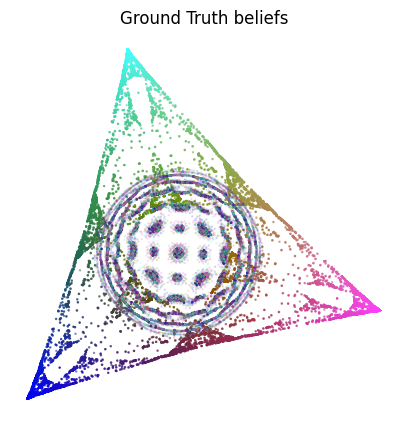

In [112]:

A = alpha_from_probs(probs, min_alpha=0.15, mode="cbrt")
colors = np.stack([R, G, B, A], axis=1)

# Рисуем
plt.figure(figsize=(5,5))
plt.scatter(x, y, s=2.0, c=colors, marker='.', rasterized=True)
plt.scatter(coords[:,2], coords[:,3], s=2.0, c=colors, marker='.', rasterized=True)
plt.gca().set_aspect('equal', adjustable='box')
plt.axis('off')
plt.title("Ground Truth beliefs")
plt.show()

In [95]:
# Путь к вашему GT
gt_path = "target_result/run_0_L2_H2_DH16_DM32_mixture/mixture_ground_truth_data.joblib"
gt = joblib.load(gt_path)
beliefs = np.asarray(gt["beliefs"])   # (N, D)
probs   = np.asarray(gt["probs"])     # (N,)
beliefs, probs

(array([[ 0.85   ,  0.075  ,  0.075  ,  0.33333,  0.     ,  0.09156],
        [ 0.075  ,  0.85   ,  0.075  ,  0.33333,  0.     , -0.09156],
        [ 0.075  ,  0.075  ,  0.85   ,  0.33333,  0.09156,  0.     ],
        ...,
        [ 0.08585,  0.89122,  0.02292,  0.33333,  0.30836, -0.09156],
        [ 0.20235,  0.18534,  0.61231,  0.33333, -0.31144,  0.     ],
        [ 0.84527,  0.01651,  0.13822,  0.33333, -0.32608,  0.     ]],
       shape=(87380, 6), dtype=float32),
 array([1.6723804e-01, 1.6723527e-01, 1.6723359e-01, ..., 2.4182865e-08,
        7.5489694e-09, 3.7047180e-08], shape=(87380,), dtype=float32))

In [96]:
beliefs.shape[1]

6

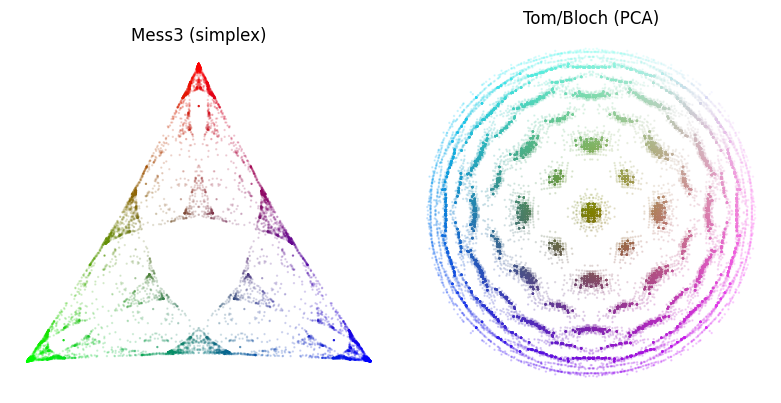

In [1]:
import joblib, numpy as np, matplotlib.pyplot as plt
from sklearn.decomposition import PCA

gt_path_mess  = "target_result/run_0_L2_H2_DH16_DM32_mixture/mess3_ground_truth_data.joblib"
gt_path_bloch = "target_result/run_0_L2_H2_DH16_DM32_mixture/tom_quantum_ground_truth_data.joblib"

def alpha_from_probs(w, min_alpha=0.15, mode="cbrt"):
    w = np.clip(w / (w.max() + 1e-8), 0, 1)
    if mode == "cbrt": a = np.cbrt(w)
    elif mode == "sqrt": a = np.sqrt(w)
    elif mode == "log": a = np.log1p(w*100)/np.log1p(100)
    else: a = w
    return a*(1-min_alpha)+min_alpha

def normalize(v):
    v = np.asarray(v); mn, mx = np.nanmin(v), np.nanmax(v)
    return (v - mn)/(mx - mn + 1e-8)

def project_to_simplex(xyz):
    x_temp = xyz[:,0] - xyz[:,1]/2 - xyz[:,2]/2
    y_temp = np.sqrt(3)/2 * (xyz[:,1] - xyz[:,2])
    x = -y_temp; y = x_temp
    return x, y

def prepare_coords_colors(beliefs, probs, use_simplex=False):
    D = beliefs.shape[1]
    if use_simplex and D >= 3:
        x, y = project_to_simplex(beliefs[:, :3])
        R, G, B = normalize(beliefs[:,0]), normalize(beliefs[:,1]), normalize(beliefs[:,2])
    else:
        pca = PCA(n_components=2).fit(beliefs)
        coords = pca.transform(beliefs)
        x, y = coords[:,0], coords[:,1]
        R, G = normalize(x), normalize(y)
        B = normalize(np.sqrt(x**2 + y**2))
    A = alpha_from_probs(probs, min_alpha=0.15, mode="cbrt")
    colors = np.stack([R, G, B, A], axis=1)
    return x, y, colors

gt_mess  = joblib.load(gt_path_mess)
gt_bloch = joblib.load(gt_path_bloch)

x1, y1, c1 = prepare_coords_colors(np.asarray(gt_mess["beliefs"]),  np.asarray(gt_mess["probs"]),  use_simplex=True)
x2, y2, c2 = prepare_coords_colors(np.asarray(gt_bloch["beliefs"]), np.asarray(gt_bloch["probs"]), use_simplex=False)

fig, axes = plt.subplots(1, 2, figsize=(8,4))
axes[0].scatter(x1, y1, s=2.0, c=c1, marker='.', rasterized=True)
axes[1].scatter(x2, y2, s=2.0, c=c2, marker='.', rasterized=True)
for ax, title in zip(axes, ["Mess3 (simplex)", "Tom/Bloch (PCA)"]):
    ax.set_aspect('equal', adjustable='box'); ax.axis('off'); ax.set_title(title)
plt.tight_layout(); plt.show()

In [2]:
import os, json, glob, joblib, torch, numpy as np
from transformer_lens import HookedTransformer, HookedTransformerConfig
from scripts.activation_analysis.data_loading import ActivationExtractor
from scripts.activation_analysis.config import TRANSFORMER_ACTIVATION_KEYS, RCOND_SWEEP_LIST
from scripts.activation_analysis.run_regression_analysis import (
    deduplicate_data, calculate_weighted_pca_variance, _combine_layer_activations
)
from scripts.activation_analysis.regression import run_activation_to_beliefs_regression_kf


def load_model(run_dir, ckpt='last'):
    with open(os.path.join(run_dir, 'hooked_model_config.json')) as f:
        cfg = HookedTransformerConfig.from_dict(json.load(f))
    model = HookedTransformer(cfg)
    if ckpt == 'last':
        pts = sorted(glob.glob(os.path.join(run_dir, '*.pt')))
        assert pts, "no checkpoints found"
        ckpt_path = pts[-1]
    else:
        ckpt_path = os.path.join(run_dir, f'{ckpt}.pt')
    sd = torch.load(ckpt_path, map_location='cpu')
    model.load_state_dict(sd, strict=True)
    model.eval()
    return model, os.path.basename(ckpt_path).split('.')[0]

def run_regression_like_pipeline(run_dir, gt_path, out_joblib):
    # 1) GT
    gt = joblib.load(gt_path)
    X_tokens = torch.tensor(np.stack([np.array(t, np.int64) for t in gt['indices']]), dtype=torch.long)  # (N,L)
    Y_beliefs = torch.tensor(gt['beliefs'], dtype=torch.float32)
    W_probs   = torch.tensor(gt['probs'],   dtype=torch.float32)

    # 2) Дедупликация (точно как в пайплайне)
    dedup_probs, dedup_beliefs, dedup_indices, prefix_to_indices = deduplicate_data(X_tokens, W_probs, Y_beliefs)

    # 3) Активации по всем слоям + combined
    model, ckpt_ind = load_model(run_dir, ckpt='last')
    act_extractor = ActivationExtractor(device='cpu')
    acts_dict = act_extractor.get_transformer_activations(model, X_tokens, TRANSFORMER_ACTIVATION_KEYS)
    nn_acts = {k: v for k, v in acts_dict.items()}
    nn_acts['combined'] = _combine_layer_activations(nn_acts)

    # 4) Дедупликация активаций и PCA метрики
    save_data = {}
    for layer, act in nn_acts.items():

        dedup_acts, _ = deduplicate_data(X_tokens, torch.ones_like(W_probs), act)[1:3]  # возвращает (probs, beliefs, indices); тут берём beliefs==acts
        # PCA инфо (как в пайплайне)
        z = (dedup_acts.numpy() - dedup_acts.numpy().mean(0)) / (dedup_acts.numpy().std(0) + 1e-8)
        cum_var_exp, _, _ = calculate_weighted_pca_variance(dedup_acts.numpy(), dedup_probs.numpy())
        cum_var_exp_z, _, _ = calculate_weighted_pca_variance(z, dedup_probs.numpy())

        # 5) K-fold + rcond-sweep (их функция)
        # Разбивки пайплайн делает через compute_kfold_split; можно быстро сделать 10‑fold:
        from sklearn.model_selection import KFold
        kf = KFold(n_splits=10, shuffle=True, random_state=42)
        kf_list = list(kf.split(np.arange(dedup_probs.shape[0])))

        res = run_activation_to_beliefs_regression_kf(
            regression_analyzer=None,
            activations=dedup_acts, beliefs=dedup_beliefs, probs=dedup_probs,
            kf=kf_list, rcond_values=RCOND_SWEEP_LIST
        )

        save_data[layer] = {
            'predicted_beliefs': res['predictions'],
            'rmse': res['final_metrics']['rmse'],
            'mae':  res['final_metrics']['mae'],
            'mse':  res['final_metrics']['mse'],
            'r2':   res['final_metrics']['r2'],
            'dist': res['final_metrics']['dist'],
            'cum_var_exp': cum_var_exp,
            'cum_var_exp_zscore': cum_var_exp_z,
            'val_loss_mean': float('nan'),
        }

    joblib.dump(save_data, os.path.join(run_dir, f'checkpoint_{ckpt_ind}.joblib'))
    return os.path.join(run_dir, f'checkpoint_{ckpt_ind}.joblib')

/workspace-SR008.nfs2/nachevsky/simplex/epsilon-transformers/.venv/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
2025-10-23 16:12:50,691 - root - INFO - Logging session started. Log file: logs/analysis_20251023_161250.log


In [3]:
# Путь к вашему GT
gt_path = "target_result/run_0_L2_H2_DH16_DM32_mixture/mixture_ground_truth_data.joblib"
gt = joblib.load(gt_path)
X_tokens = torch.tensor(np.stack([np.array(t, np.int64) for t in gt['indices']]), dtype=torch.long)  # (N,L)
Y_beliefs = torch.tensor(gt['beliefs'], dtype=torch.float32)
W_probs   = torch.tensor(gt['probs'],   dtype=torch.float32)

dedup_probs, dedup_beliefs, dedup_indices, prefix_to_indices = deduplicate_data(X_tokens, W_probs, Y_beliefs)

ValueError: all input arrays must have the same shape

In [5]:
import os, glob, json, joblib, numpy as np, torch
from transformer_lens import HookedTransformer, HookedTransformerConfig

# 1) GT -> MSP c фиксированным n_ctx
def gt_to_msp_fixed_ctx(gt_path, n_ctx: int):
    gt = joblib.load(gt_path)
    beliefs = np.asarray(gt['beliefs']).astype(np.float32)
    probs   = np.asarray(gt['probs']).astype(np.float32)
    indices = np.asarray(gt['indices'], dtype=object)

    mask = np.array([len(t)==n_ctx for t in indices])
    beliefs, probs, indices = beliefs[mask], probs[mask], indices[mask]
    X_tokens = torch.tensor(np.stack([np.array(t, np.int64) for t in indices]), dtype=torch.long)
    Y_beliefs = torch.tensor(beliefs, dtype=torch.float32)
    W_probs   = torch.tensor(probs,   dtype=torch.float32)
    return X_tokens, Y_beliefs, W_probs, indices  # (N,L), (N,B), (N,), list-of-tuples

# 2) Ровно как в run_regression_analysis: карта префиксов и дедупликация
def find_duplicate_prefixes(nn_inputs: torch.Tensor):
    batch_size, seq_len = nn_inputs.shape
    prefix_to_indices = {}
    for seq_idx in range(batch_size):
        seq = nn_inputs[seq_idx]
        for pos in range(seq_len):
            prefix = tuple(seq[:pos+1].cpu().numpy().tolist())
            prefix_to_indices.setdefault(prefix, []).append((seq_idx, pos))
    return prefix_to_indices

def deduplicate_tensor(prefix_to_indices, tensor: torch.Tensor, aggregation_fn=None):
    # tensor shape: (N, L, ...) для актов/белифов или (N, L) для probs-по-позициям; для скалярных probs (N,) расширим
    if tensor.ndim == 1:
        tensor = tensor[:, None]                               # (N,1)
    if tensor.ndim == 2:                                       # (N,L) -> (N,L,1)
        tensor = tensor[:, :, None]
    unique_vals, unique_prefixes = [], []
    for prefix, lst in prefix_to_indices.items():
        vals = [tensor[i, j] for (i, j) in lst]                # список тензоров (...,)
        if aggregation_fn is None:
            out = vals[0]
        else:
            out = aggregation_fn(vals)                          # напр. sum
        unique_vals.append(out)
        unique_prefixes.append(prefix)
    out = torch.stack([v.squeeze(0) if v.ndim==1 else v.squeeze() for v in unique_vals], dim=0)
    return out, unique_prefixes                                # (U, ...), list[prefix]

def deduplicate_data(nn_inputs: torch.Tensor, probs_scalar: torch.Tensor, beliefs: torch.Tensor):
    # nn_inputs: (N, L), probs_scalar: (N,), beliefs: (N, B)
    N, L = nn_inputs.shape
    prefix_to_indices = find_duplicate_prefixes(nn_inputs)

    # 1) позиционные веса: только последний токен несёт вес
    probs_pos = torch.zeros((N, L), dtype=probs_scalar.dtype)
    probs_pos[:, -1] = probs_scalar

    # 2) позиционные beliefs: только последняя позиция несёт belief-вектор
    B = beliefs.shape[1]
    beliefs_pos = torch.zeros((N, L, B), dtype=beliefs.dtype)
    beliefs_pos[:, -1, :] = beliefs

    # 3) дедуп по одной и той же карте префиксов
    dedup_probs_pos, _   = deduplicate_tensor(prefix_to_indices, probs_pos,   aggregation_fn=lambda xs: torch.stack(xs).sum(0))
    dedup_beliefs_pos, _ = deduplicate_tensor(prefix_to_indices, beliefs_pos, aggregation_fn=None)

    # 4) забираем «итог» с последней позиции и нормируем веса
    dedup_probs = dedup_probs_pos[:, -1]
    dedup_probs = dedup_probs / (dedup_probs.sum() + 1e-12)
    dedup_beliefs = dedup_beliefs_pos[:, -1, :]  # (U, B)

    return dedup_probs, dedup_beliefs, prefix_to_indices

# 3) Активации по слоям + combined (как в пайплайне)
def load_model(run_dir, ckpt='last'):
    with open(os.path.join(run_dir, 'hooked_model_config.json')) as f:
        cfg = HookedTransformerConfig.from_dict(json.load(f))
    model = HookedTransformer(cfg)
    if ckpt == 'last':
        pts = sorted(glob.glob(os.path.join(run_dir, '*.pt')))
        assert pts, "no checkpoints found"
        ckpt_path = pts[-1]
    else:
        ckpt_path = os.path.join(run_dir, f'{ckpt}.pt')
    sd = torch.load(ckpt_path, map_location='cpu')
    model.load_state_dict(sd, strict=True); model.eval()
    return model, os.path.basename(ckpt_path).split('.')[0]

def get_acts_all_layers(model, X_tokens: torch.Tensor):
    with torch.no_grad():
        _, cache = model.run_with_cache(X_tokens)
    acts = {}
    for i in range(model.cfg.n_layers):
        key = f'blocks.{i}.hook_resid_post'
        acts[key] = cache[key]                                  # (N,L,d_model)
    # combined: конкат по скрытому измерению (n_layers * d_model)
    acts['combined'] = torch.cat([acts[k] for k in acts if k.startswith('blocks.')], dim=2)
    return acts

In [6]:
n_ctx = 8
X_tokens, Y_beliefs, W_probs, _ = gt_to_msp_fixed_ctx(gt_path, n_ctx)
dedup_probs, dedup_beliefs, prefix_to_indices = deduplicate_data(X_tokens, W_probs, Y_beliefs)

IndexError: too many indices for tensor of dimension 1

In [8]:
import torch, joblib, numpy as np
from scripts.activation_analysis.run_regression_analysis import (
    find_duplicate_prefixes, deduplicate_tensor
)

def gt_to_msp_fixed_ctx(gt_path: str, n_ctx: int):
    gt = joblib.load(gt_path)
    beliefs = np.asarray(gt['beliefs'], dtype=np.float32)   # (N,B)
    probs   = np.asarray(gt['probs'],   dtype=np.float32)   # (N,)
    indices = np.asarray(gt['indices'], dtype=object)       # (N,) tuples

    mask = np.array([len(t)==n_ctx for t in indices])
    beliefs, probs, indices = beliefs[mask], probs[mask], indices[mask]

    X_tokens = torch.tensor(np.stack([np.array(t, np.int64) for t in indices]), dtype=torch.long)  # (N,L)
    Y_beliefs = torch.tensor(beliefs, dtype=torch.float32)                                         # (N,B)
    W_probs   = torch.tensor(probs,   dtype=torch.float32)                                         # (N,)
    return X_tokens, Y_beliefs, W_probs, indices

def deduplicate_data(
    X_tokens: torch.Tensor, probs_scalar: torch.Tensor, beliefs_scalar: torch.Tensor
):
    # X_tokens: (N,L), probs_scalar: (N,), beliefs_scalar: (N,B)
    N, L = X_tokens.shape
    B = beliefs_scalar.shape[1]

    # позиционные представления: вес и таргет только на последней позиции
    probs_pos   = torch.zeros((N, L),   dtype=probs_scalar.dtype)
    beliefs_pos = torch.zeros((N, L, B), dtype=beliefs_scalar.dtype)
    probs_pos[:, -1]      = probs_scalar
    beliefs_pos[:, -1, :] = beliefs_scalar

    # карта префиксов и дедуп ровно их функциями
    p2i = find_duplicate_prefixes(X_tokens)
    dedup_probs_pos,   _ = deduplicate_tensor(p2i, probs_pos,   aggregation_fn=lambda xs: torch.stack(xs).sum(0))
    dedup_beliefs_pos, _ = deduplicate_tensor(p2i, beliefs_pos, aggregation_fn=None)

    # забираем последнюю позицию и нормируем веса
    dedup_probs   = dedup_probs_pos           # (U,)
    dedup_beliefs = dedup_beliefs_pos         # (U,B)
    dedup_probs   = dedup_probs / (dedup_probs.sum() + 1e-12)
    return dedup_probs, dedup_beliefs, p2i


/workspace-SR008.nfs2/nachevsky/simplex/epsilon-transformers/.venv/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
2025-10-23 21:49:57,138 - root - INFO - Logging session started. Log file: logs/analysis_20251023_214957.log


In [8]:
n_ctx = 8
X_tokens, Y_beliefs, W_probs, indices = gt_to_msp_fixed_ctx(gt_path, n_ctx)
dedup_probs, dedup_beliefs, prefix_to_indices = deduplicate_data(X_tokens, W_probs, Y_beliefs)

In [10]:
import os, glob, json, torch
from pathlib import Path

from transformer_lens import HookedTransformer, HookedTransformerConfig

def load_model(run_dir, ckpt='first and last', device='cpu'):
    with open(os.path.join(run_dir, 'hooked_model_config.json')) as f:
        d = json.load(f)
    # fix dtype: "torch.float32" -> torch.float32
    if isinstance(d.get('dtype'), str):
        d['dtype'] = getattr(torch, d['dtype'].split('.')[-1])
    cfg = HookedTransformerConfig.from_dict(d)

    if ckpt == 'first and last':
        pts = sorted(Path(run_dir).glob('*.pt'), key=lambda p: p.stat().st_mtime) 
        another = sorted(Path(run_dir).glob('*.pt')) 
        assert pts, "no checkpoints found"
        ckpt_paths = [pts[0], pts[-1], another[-1]]
    else:
        ckpt_paths = [os.path.join(run_dir, f'{ckpt}.pt')]

    models = []
    for ckpt_path in ckpt_paths:
        model = HookedTransformer(cfg, move_to_device=False).to(device)
        print(ckpt_path)
        sd = torch.load(ckpt_path, map_location=device)
        model.load_state_dict(sd, strict=True)
        model.eval()
        models.append(model)
    return models, ckpt_paths


In [10]:
run_dir = "target_result/run_0_L2_H2_DH16_DM32_mixture"
models, ckpt_paths = load_model(run_dir, ckpt='first and last')

Moving model to device:  cpu
target_result/run_0_L2_H2_DH16_DM32_mixture/0.pt
Moving model to device:  cpu
target_result/run_0_L2_H2_DH16_DM32_mixture/4075724800.pt
Moving model to device:  cpu
target_result/run_0_L2_H2_DH16_DM32_mixture/983244800.pt


In [11]:
ckpt_paths

[PosixPath('target_result/run_0_L2_H2_DH16_DM32_mixture/0.pt'),
 PosixPath('target_result/run_0_L2_H2_DH16_DM32_mixture/4075724800.pt'),
 PosixPath('target_result/run_0_L2_H2_DH16_DM32_mixture/983244800.pt')]

In [16]:
import os, glob, json, joblib, numpy as np, torch
from transformer_lens import HookedTransformerConfig, HookedTransformer
from scripts.activation_analysis.data_loading import ActivationExtractor
from scripts.activation_analysis.config import TRANSFORMER_ACTIVATION_KEYS, RCOND_SWEEP_LIST
from scripts.activation_analysis.run_regression_analysis import (
    find_duplicate_prefixes, deduplicate_tensor, _combine_layer_activations, compute_kfold_split
)
from scripts.activation_analysis.regression import RegressionAnalyzer, run_activation_to_beliefs_regression_kf

device = "cuda"
def get_dedup_acts(model, X_tokens, p2i, device='cpu'):
    actx = ActivationExtractor(device=device)
    acts_ = actx.extract_activations(model, X_tokens, model_type='transformer', relevant_activation_keys=TRANSFORMER_ACTIVATION_KEYS)
    nn_acts = {k: v for k, v in acts_.items()}
    nn_acts['combined'] = _combine_layer_activations(nn_acts)
    dedup = {layer: deduplicate_tensor(p2i, act, aggregation_fn=None)[0] for layer, act in nn_acts.items()}  # (U,D)
    return dedup


In [14]:
dedup_beliefs

tensor([[ 0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000],
        [ 0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000],
        [ 0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000],
        ...,
        [ 0.2024,  0.1853,  0.6123,  0.3333, -0.3114,  0.0000],
        [ 0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000],
        [ 0.8453,  0.0165,  0.1382,  0.3333, -0.3261,  0.0000]])

In [71]:
dedup_probs, dedup_beliefs, p2i = deduplicate_data(X_tokens, W_probs, Y_beliefs)

In [73]:
p2i.keys

114152

In [72]:
for item in (dedup_probs, dedup_beliefs, p2i):
    print(item.shape)

torch.Size([114152])
torch.Size([114152, 6])


AttributeError: 'dict' object has no attribute 'shape'

In [ ]:
get_dedup_acts(model, X_tokens, p2i)

In [18]:
def run_full_regression(model, gt_path, n_ctx=8, device='cpu'):
    X_tokens, Y_beliefs, W_probs, _ = gt_to_msp_fixed_ctx(gt_path, n_ctx)
    dedup_probs, dedup_beliefs, p2i = deduplicate_data(X_tokens, W_probs, Y_beliefs)
    dedup_layer_acts = get_dedup_acts(model, X_tokens, p2i, device=device)

    # мб без дедап зафигарить и может сработать

    # KFold из пайплайна
    kf, all_positions = compute_kfold_split(dedup_probs)
    kf_list = list(kf.split(all_positions))

    # можно без кфолд)))000
    # отдельно месс и отдельно блох

    reg_analyzer = RegressionAnalyzer(device=device, use_efficient_pinv=True)
    save_data = {}
    for layer, X in dedup_layer_acts.items():
        print(layer)
        res = run_activation_to_beliefs_regression_kf(
            reg_analyzer,
            X.to(device), dedup_beliefs.to(device), dedup_probs.to(device),
            kf_list, rcond_values=RCOND_SWEEP_LIST
        )
        save_data[layer] = {
            'predicted_beliefs': res['predictions'],
            'rmse':  res['final_metrics']['rmse'],
            'mae':   res['final_metrics']['mae'],
            'r2':    res['final_metrics']['r2'],
            'dist':  res['final_metrics']['dist'],
            'mse':   res['final_metrics']['mse'],
            'cum_var_exp': None, 'cum_var_exp_zscore': None,
            'val_loss_mean': float('nan'),
        }
    return save_data

In [20]:
start = run_full_regression(models[0], gt_path)
finish = run_full_regression(models[1], gt_path)
middle = run_full_regression(models[2], gt_path)

blocks.0.hook_resid_pre
Best rcond from CV: 1e-05, with avg error: 0.331843
Training final model with SVD using rcond=1e-05
blocks.0.hook_resid_post
Best rcond from CV: 1e-15, with avg error: 0.258266
Training final model with SVD using rcond=1e-15
blocks.1.hook_resid_post
Best rcond from CV: 1e-15, with avg error: 0.456923
Training final model with SVD using rcond=1e-15
ln_final.hook_normalized
Best rcond from CV: 1e-05, with avg error: 0.596390
Training final model with SVD using rcond=1e-05
combined
Best rcond from CV: 1e-05, with avg error: 0.238917
Training final model with SVD using rcond=1e-05


In [ ]:
out = os.path.join(run_dir, f'checkpoint_{ckpt_id}.joblib')
joblib.dump(save_data, out); print("Saved:", out)

In [102]:
gt = joblib.load(gt_path)
gt_beliefs = np.asarray(gt["beliefs"])     # (N, D)
gt_probs   = np.asarray(gt["probs"])       # (N,)


In [21]:
import joblib, numpy as np, matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from pathlib import Path
import os

layer = "combined"   # тот же слой, что используешь в анализе
use_simplex_if_3d = True

pred_beliefs = start[layer].get("predicted_beliefs", None)  # (N, D) или None
rmse = start[layer].get("rmse", None)


In [14]:
def alpha_from_probs(w, min_alpha=0.15, mode="cbrt"):
    w = np.clip(w / (w.max() + 1e-8), 0, 1)
    if mode == "cbrt": a = np.cbrt(w)
    elif mode == "sqrt": a = np.sqrt(w)
    elif mode == "log": a = np.log1p(w*100)/np.log1p(100)
    else: a = w
    return a*(1-min_alpha)+min_alpha

def normalize(v):
    v = np.asarray(v); mn, mx = np.nanmin(v), np.nanmax(v)
    return (v - mn)/(mx - mn + 1e-8)

def project_to_simplex(xyz):
    x_temp = xyz[:,0] - xyz[:,1]/2 - xyz[:,2]/2
    y_temp = np.sqrt(3)/2 * (xyz[:,1] - xyz[:,2])
    return -y_temp, x_temp  # поворот как в Fig2


In [24]:
n_ctx = 8
X_tokens, Y_beliefs, W_probs, _ = gt_to_msp_fixed_ctx(gt_path, n_ctx)
dedup_probs, dedup_beliefs, prefix_to_indices = deduplicate_data(X_tokens, W_probs, Y_beliefs)

In [27]:
X_tokens.shape, dedup_probs.shape

(torch.Size([65536, 8]), torch.Size([114152]))

In [37]:
# вместо сырых gt_* используем дедуп
beliefs = dedup_beliefs.numpy()    # (U, D)
probs   = dedup_probs.numpy()      # (U,)

# те же функции normalize/alpha/project_to_simplex/PCA
D = beliefs.shape[1]
if True:
    x_gt, y_gt = project_to_simplex(beliefs[:, :3])
    R, G, B = normalize(beliefs[:,0]), normalize(beliefs[:,1]), normalize(beliefs[:,2])
else:
    pca = PCA(n_components=2).fit(beliefs)
    xy  = pca.transform(beliefs)
    x_gt, y_gt = xy[:,0], xy[:,1]
    R, G = normalize(x_gt), normalize(y_gt)
    B    = normalize(np.sqrt(x_gt**2 + y_gt**2))

A = alpha_from_probs(probs)
colors = np.stack([R, G, B, A], axis=1)

pred = start[layer]['predicted_beliefs']  # (U, D)
x_pred, y_pred = project_to_simplex(pred[:, 3:])
# x_pred, y_pred = pca.transform(pred)[:,0], pca.transform(pred)[:,1]




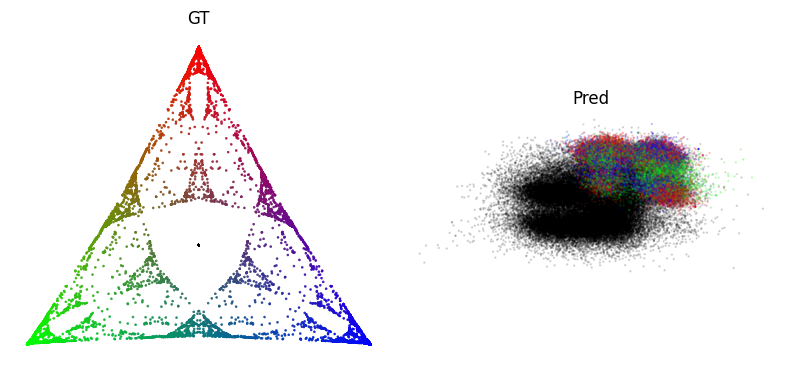

In [38]:
fig, axes = plt.subplots(1, 2, figsize=(8, 4))
axes[0].scatter(x_gt, y_gt, s=2.0, c=colors, marker='.', rasterized=True)
axes[0].set_title("GT");   axes[0].set_aspect('equal'); axes[0].axis('off')

axes[1].scatter(x_pred, y_pred, s=2.0, c=colors, marker='.', rasterized=True)
axes[1].set_title("Pred"); axes[1].set_aspect('equal'); axes[1].axis('off')

plt.tight_layout(); plt.show()

In [39]:
pred[:, :3].shape

(114152, 3)

In [40]:
pca = PCA(n_components=4).fit(pred)

pca.transform(pred)

array([[-0.90007836, -0.45483607,  0.09809299,  0.33013013],
       [-0.22868621, -0.91034126, -0.0065244 ,  0.3113189 ],
       [ 0.61295205, -0.9038778 , -0.04796819,  0.12603612],
       ...,
       [ 0.2548858 , -0.14040089,  0.01132768, -0.01413469],
       [ 1.0756303 , -0.01516054, -0.13160034, -0.04770951],
       [-0.5426821 , -0.38350743, -0.03840934,  0.01038835]],
      shape=(114152, 4), dtype=float32)

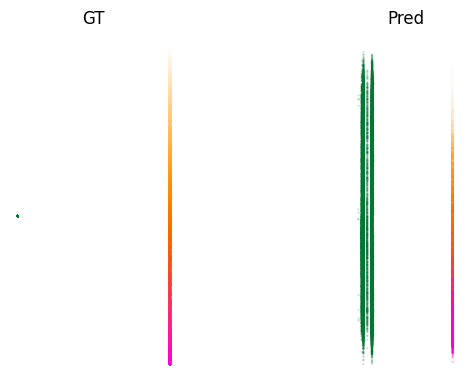

In [55]:
A = alpha_from_probs(probs)
colors = np.stack([R, G, B, A], axis=1)

pred = finish[layer]['predicted_beliefs']  # (U, D)

x_pred, y_pred = pca.transform(pred)[:,0], pca.transform(pred)[:,1]


fig, axes = plt.subplots(1, 2, figsize=(8, 4))
axes[0].scatter(x_gt, y_gt, s=2.0, c=colors, marker='.', rasterized=True)
axes[0].set_title("GT");   axes[0].set_aspect('equal'); axes[0].axis('off')

axes[1].scatter(x_pred, y_pred, s=2.0, c=colors, marker='.', rasterized=True)
axes[1].set_title("Pred"); axes[1].set_aspect('equal'); axes[1].axis('off')

plt.tight_layout(); plt.show()

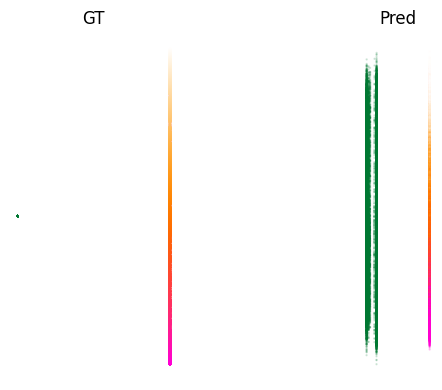

In [53]:
A = alpha_from_probs(probs)
colors = np.stack([R, G, B, A], axis=1)

pred = middle[layer]['predicted_beliefs']  # (U, D)

x_pred, y_pred = pca.transform(pred)[:,0], pca.transform(pred)[:,1]



fig, axes = plt.subplots(1, 2, figsize=(8, 4))
axes[0].scatter(x_gt, y_gt, s=2.0, c=colors, marker='.', rasterized=True)
axes[0].set_title("GT");   axes[0].set_aspect('equal'); axes[0].axis('off')

axes[1].scatter(x_pred, y_pred, s=2.0, c=colors, marker='.', rasterized=True)
axes[1].set_title("Pred"); axes[1].set_aspect('equal'); axes[1].axis('off')

plt.tight_layout(); plt.show()

In [46]:
run_dir = "results/20251023101728/run_0_L4_H4_DH16_DM64_mixture"
models, ckpt_paths = load_model(run_dir, ckpt='first and last')

Moving model to device:  cpu
results/20251023101728/run_0_L4_H4_DH16_DM64_mixture/0.pt
Moving model to device:  cpu
results/20251023101728/run_0_L4_H4_DH16_DM64_mixture/4424089600.pt
Moving model to device:  cpu
results/20251023101728/run_0_L4_H4_DH16_DM64_mixture/983449600.pt


In [47]:
start = run_full_regression(models[0], gt_path)
finish = run_full_regression(models[1], gt_path)
middle = run_full_regression(models[2], gt_path)

blocks.0.hook_resid_pre
Best rcond from CV: 1e-05, with avg error: 0.331843
Training final model with SVD using rcond=1e-05
blocks.0.hook_resid_post
Best rcond from CV: 1e-15, with avg error: 0.358366
Training final model with SVD using rcond=1e-15
blocks.1.hook_resid_post
Best rcond from CV: 1e-15, with avg error: 0.376111
Training final model with SVD using rcond=1e-15
blocks.2.hook_resid_post
Best rcond from CV: 1e-15, with avg error: 0.392930
Training final model with SVD using rcond=1e-15
blocks.3.hook_resid_post
Best rcond from CV: 1e-15, with avg error: 0.407059
Training final model with SVD using rcond=1e-15
ln_final.hook_normalized
Best rcond from CV: 1e-05, with avg error: 0.408393
Training final model with SVD using rcond=1e-05
combined
Best rcond from CV: 0.00012067926581948996, with avg error: 0.274812
Training final model with SVD using rcond=0.00012067926581948996
blocks.0.hook_resid_pre
Best rcond from CV: 1e-05, with avg error: 0.331843
Training final model with SVD us

In [68]:
for item in [X_tokens, Y_beliefs, W_probs]:
    print(item.shape)

torch.Size([65536, 8])
torch.Size([65536, 6])
torch.Size([65536])


In [69]:
dedup_probs.shape

torch.Size([114152])

ValueError: 'c' argument has 65536 elements, which is inconsistent with 'x' and 'y' with size 114152.

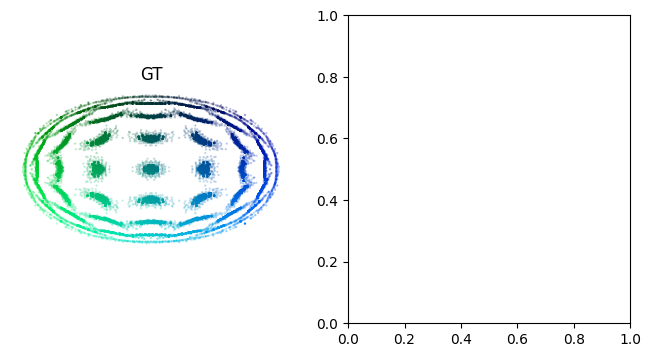

In [70]:
n_ctx = 8
X_tokens, Y_beliefs, W_probs, _ = gt_to_msp_fixed_ctx(gt_path, n_ctx)
# dedup_probs, dedup_beliefs, _ = deduplicate_data(X_tokens, W_probs, Y_beliefs)
dedup_probs, dedup_beliefs = W_probs, Y_beliefs

# вместо сырых gt_* используем дедуп
beliefs = dedup_beliefs.numpy()    # (U, D)
probs   = dedup_probs.numpy()      # (U,)

# те же функции normalize/alpha/project_to_simplex/PCA
D = beliefs.shape[1]

x_gt, y_gt = project_to_simplex(beliefs[:, 3:])
R, G, B = normalize(beliefs[:,3]), normalize(beliefs[:,4]), normalize(beliefs[:,5])

A = alpha_from_probs(probs)
colors = np.stack([R, G, B, A], axis=1)

A = alpha_from_probs(probs)
colors = np.stack([R, G, B, A], axis=1)

pred = start[layer]['predicted_beliefs']  # (U, D)

pca = PCA(n_components=4).fit(pred)

x_pred, y_pred = pca.transform(pred)[:,0], pca.transform(pred)[:,1]


fig, axes = plt.subplots(1, 2, figsize=(8, 4))
axes[0].scatter(x_gt, y_gt, s=2.0, c=colors, marker='.', rasterized=True)
axes[0].set_title("GT");   axes[0].set_aspect('equal'); axes[0].axis('off')

axes[1].scatter(x_pred, y_pred, s=2.0, c=colors, marker='.', rasterized=True)
axes[1].set_title("Pred"); axes[1].set_aspect('equal'); axes[1].axis('off')

plt.tight_layout(); plt.show()


In [78]:
X_tokens.shape

torch.Size([65536, 8])

In [80]:
actx = ActivationExtractor(device=device)
acts = actx.extract_activations(models[0], X_tokens, model_type='transformer', relevant_activation_keys=TRANSFORMER_ACTIVATION_KEYS)
nn_acts = {k: v for k, v in acts.items()}
nn_acts['combined'] = _combine_layer_activations(nn_acts)  # оставляем агрегированное представление [N, D*L] или как у вас реализовано

In [83]:
nn_acts['combined'].shape
N, L, D = X_combined.shape


torch.Size([65536, 8, 384])

In [87]:
Y_beliefs[0]

tensor([0.9893, 0.0053, 0.0053, 0.3333, 0.0000, 0.3261])

In [12]:
def regression(X, Y, W, kf_list, device):
    reg_analyzer = RegressionAnalyzer(device=device, use_efficient_pinv=True)
    res = run_activation_to_beliefs_regression_kf(
        reg_analyzer,
        X, Y, W,
        kf_list, rcond_values=RCOND_SWEEP_LIST
    )
    return  {
        'predicted_beliefs': res['predictions'],
        'rmse':  res['final_metrics']['rmse'],
        'mae':   res['final_metrics']['mae'],
        'r2':    res['final_metrics']['r2'],
        'dist':  res['final_metrics']['dist'],
        'mse':   res['final_metrics']['mse'],
        'cum_var_exp': None, 'cum_var_exp_zscore': None,
        'val_loss_mean': float('nan'),
    }

def get_acts(model, X_tokens, device):
    actx = ActivationExtractor(device=device)
    acts = actx.extract_activations(model, X_tokens, model_type='transformer', relevant_activation_keys=TRANSFORMER_ACTIVATION_KEYS)
    nn_acts = {k: v for k, v in acts.items()}
    nn_acts['combined'] = _combine_layer_activations(nn_acts)  # обычно [N,L,D]

    return nn_acts


def run_full_regression_last_token(model, X_tokens, Y_beliefs, W_probs, pos=2, device='cpu'):
    # Последний токен: X_last:[N,D], Y_last:[N,S], W:[N]
    Yb = torch.as_tensor(Y_beliefs, dtype=torch.float32, device=device)
    W = torch.as_tensor(W_probs, dtype=torch.float32, device=device)  # [N]
    kf, all_positions = compute_kfold_split(W)
    kf_list = list(kf.split(all_positions))

    nn_acts = get_acts(model, X_tokens, device)
    save_data = {}
    for layer, X in nn_acts.items():
        print(layer)
        if ("post" in layer) or ('combined' in layer):
            save_data[layer] = regression(X[:, pos, :], Yb, W, kf_list, device)
        
    return save_data

In [ ]:
X_tokens, Y_beliefs, W_probs, _ = gt_to_msp_fixed_ctx(gt_path, 8)  # X:[N,L], Y:[N,S] или [N,L,S], W:[N]

run_dir = "results/20251023101728/run_0_L4_H4_DH16_DM64_mixture"
models, ckpt_paths = load_model(run_dir, ckpt='first and last')

In [126]:
results = run_full_regression_last_token(models[1], X_tokens, Y_beliefs, W_probs, pos=6)

blocks.0.hook_resid_pre
blocks.0.hook_resid_post
Best rcond from CV: 1e-15, with avg error: 0.431373
Training final model with SVD using rcond=1e-15
blocks.1.hook_resid_post
Best rcond from CV: 1e-15, with avg error: 0.441732
Training final model with SVD using rcond=1e-15
blocks.2.hook_resid_post
Best rcond from CV: 1e-15, with avg error: 0.504284
Training final model with SVD using rcond=1e-15
blocks.3.hook_resid_post
Best rcond from CV: 1e-15, with avg error: 0.624203
Training final model with SVD using rcond=1e-15
ln_final.hook_normalized
combined
Best rcond from CV: 1e-05, with avg error: 0.446635
Training final model with SVD using rcond=1e-05


In [13]:
def plot_triangle_and_sphere(result, X_tokens, Y_beliefs, W_probs, n_ctx=8):
    pred = result['predicted_beliefs']  # (U, D)
    pca = PCA(n_components=4).fit(pred)
        
    beliefs = Y_beliefs.numpy()    # (U, D)
    probs   = W_probs.numpy()      # (U,)
    
    A = alpha_from_probs(probs)
    
    fig, axes = plt.subplots(2, 2, figsize=(8, 10))
    for item in range(2):

        add = 3 * item
        x_gt, y_gt = project_to_simplex(beliefs[:, 0 + add: 3 + add])
        x_pred, y_pred = pca.transform(pred)[:,0 + 2 * item], pca.transform(pred)[:,1 + 2 * item]
        
        R, G, B = normalize(beliefs[:, 0 + add]), normalize(beliefs[:, 1+ add]), normalize(beliefs[:, 2 + add])
        colors = np.stack([R, G, B, A], axis=1)
            
        ax = axes[item][0]
        ax.scatter(x_gt, y_gt, s=2.0, c=colors, marker='.', rasterized=True)
        ax.set_title("GT");   ax.set_aspect('equal'); ax.axis('off')
        
        ax = axes[item][1]
        ax.scatter(x_pred, y_pred, s=2.0, c=colors, marker='.', rasterized=True)
        ax.set_title("Pred"); ax.set_aspect('equal'); ax.axis('off')
        
    plt.tight_layout()
    plt.show()


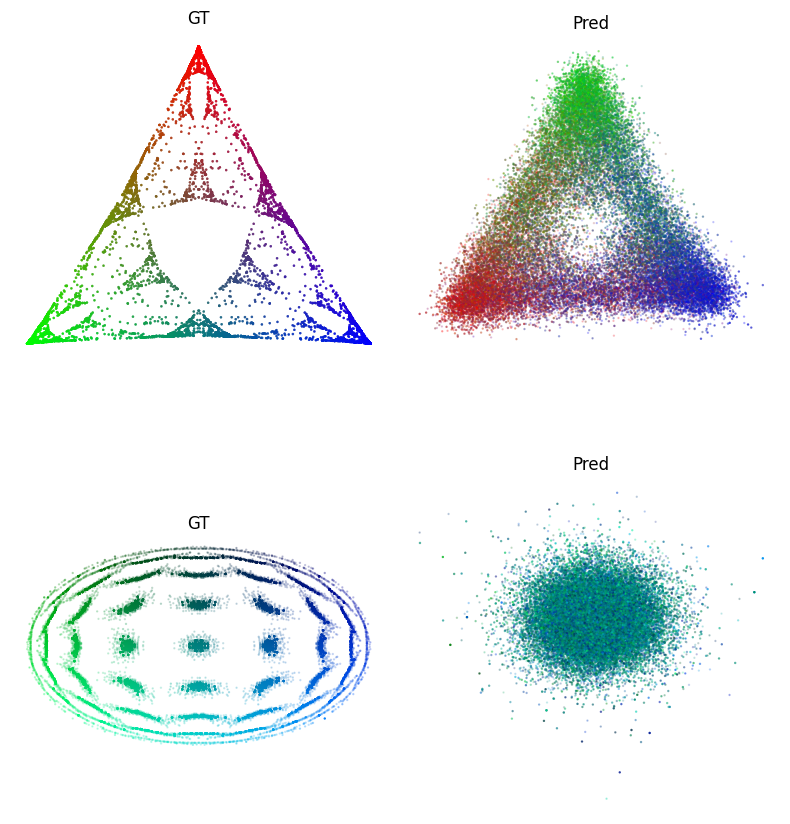

In [127]:
plot_triangle_and_sphere(results["combined"], X_tokens, Y_beliefs, W_probs, n_ctx=8)

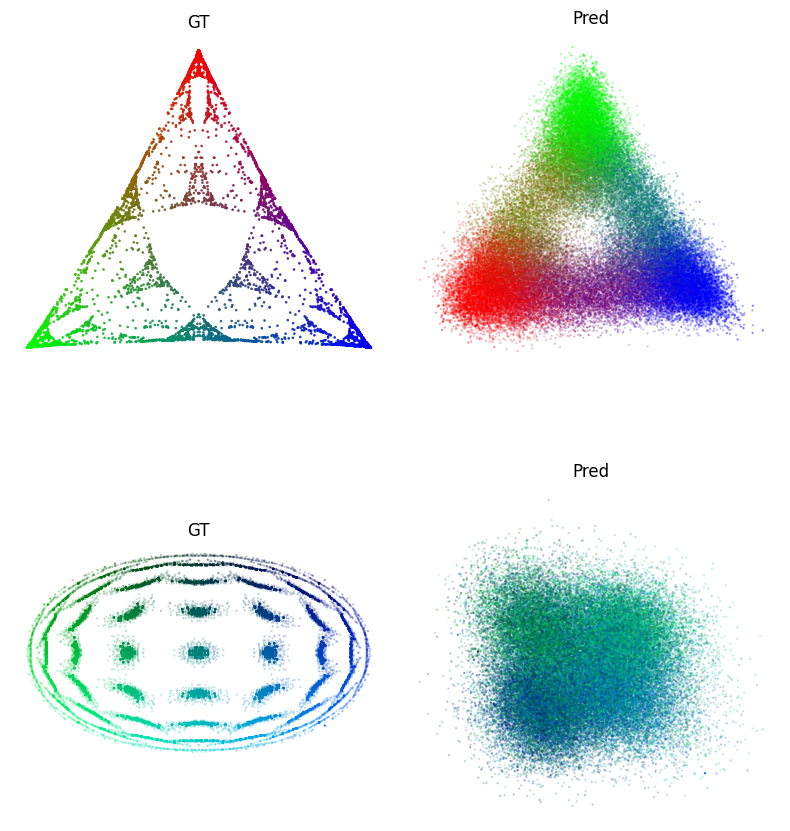

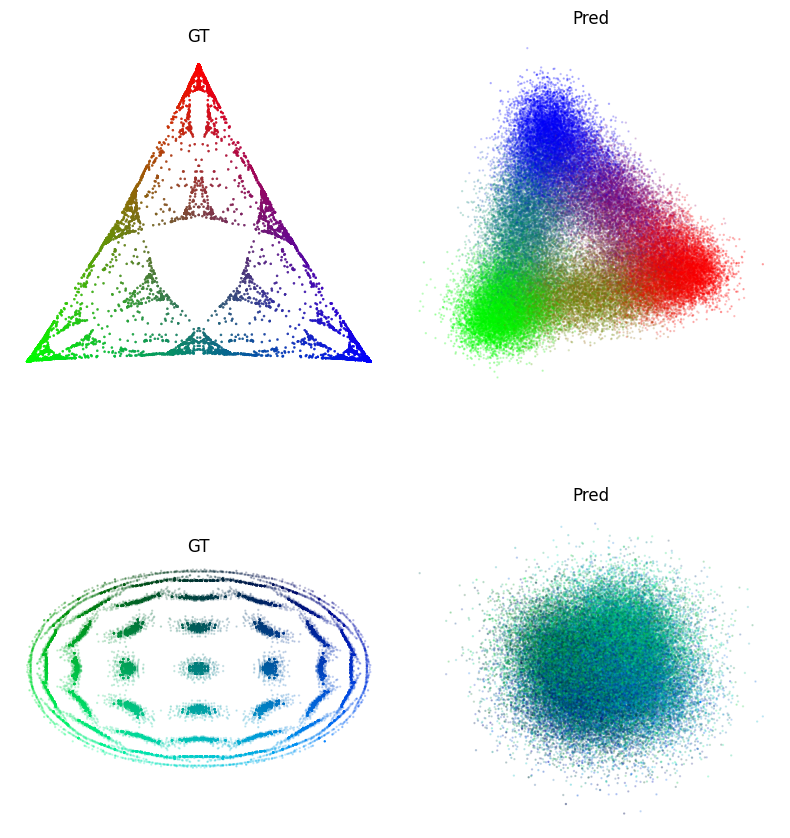

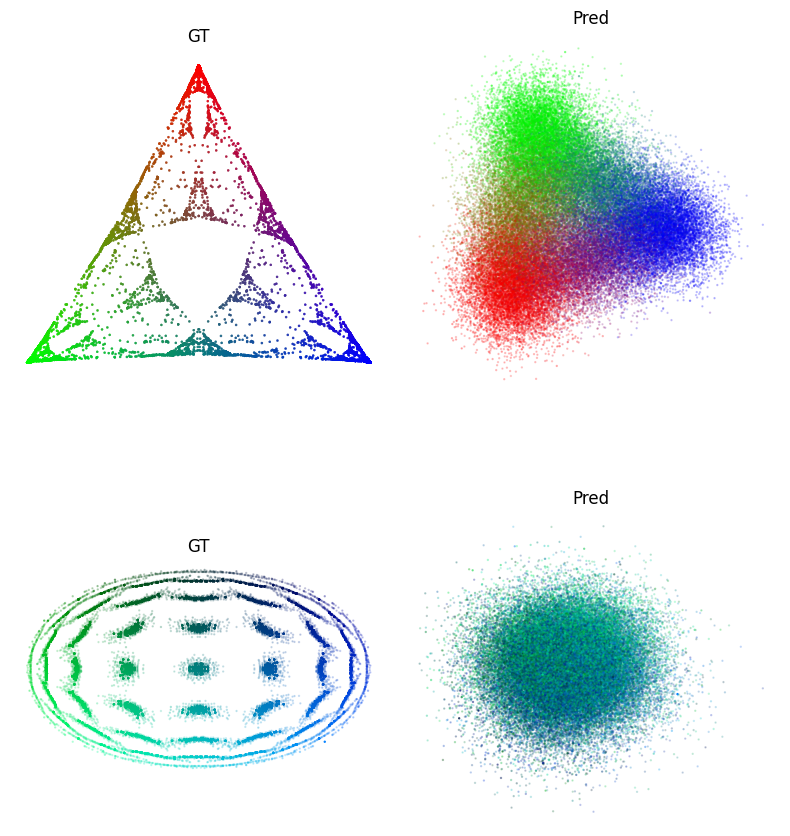

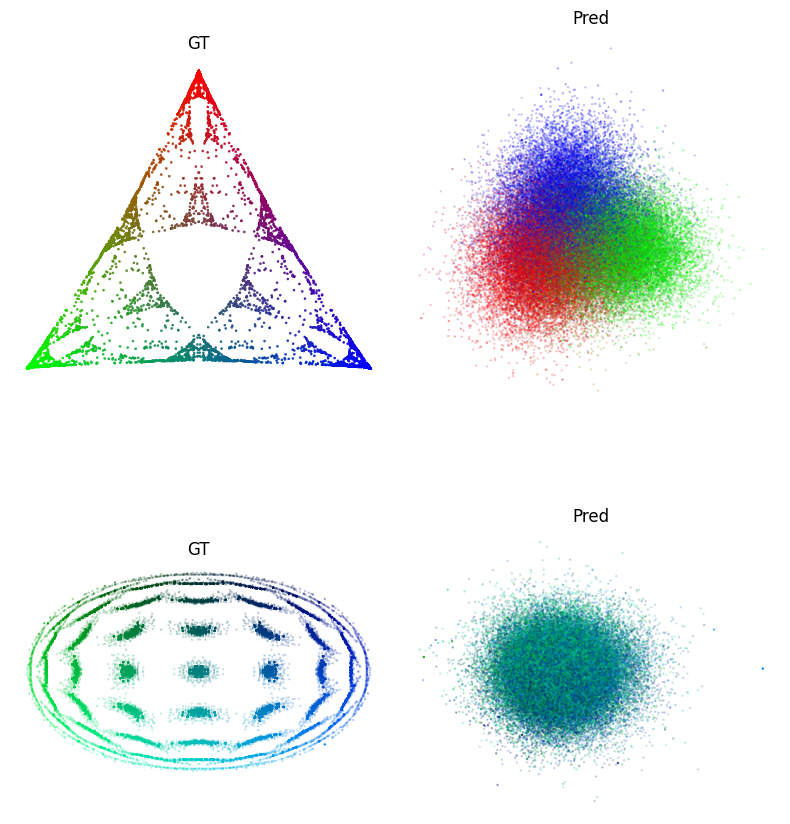

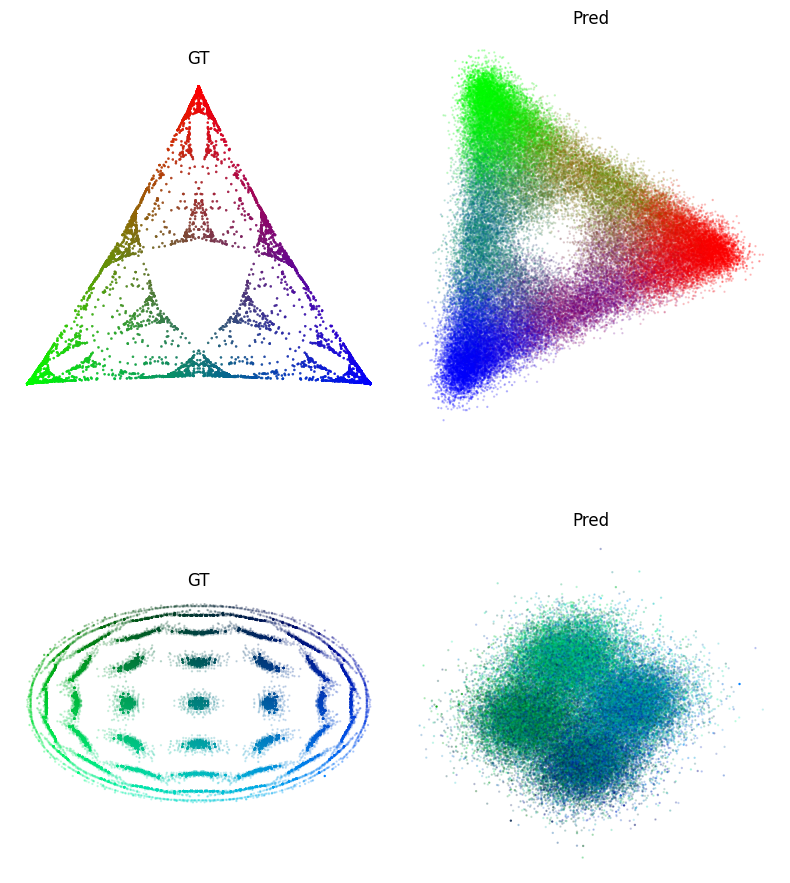

In [123]:
for layer in results:
    plot_triangle_and_sphere(results[layer], X_tokens, Y_beliefs, W_probs, n_ctx=8)

blocks.0.hook_resid_pre
blocks.0.hook_resid_post
Best rcond from CV: 1e-15, with avg error: 0.263190
Training final model with SVD using rcond=1e-15
blocks.1.hook_resid_post
Best rcond from CV: 1e-15, with avg error: 0.273162
Training final model with SVD using rcond=1e-15
blocks.2.hook_resid_post
Best rcond from CV: 1e-15, with avg error: 0.367161
Training final model with SVD using rcond=1e-15
blocks.3.hook_resid_post
Best rcond from CV: 1e-15, with avg error: 0.570850
Training final model with SVD using rcond=1e-15
ln_final.hook_normalized
combined
Best rcond from CV: 1e-05, with avg error: 0.235121
Training final model with SVD using rcond=1e-05


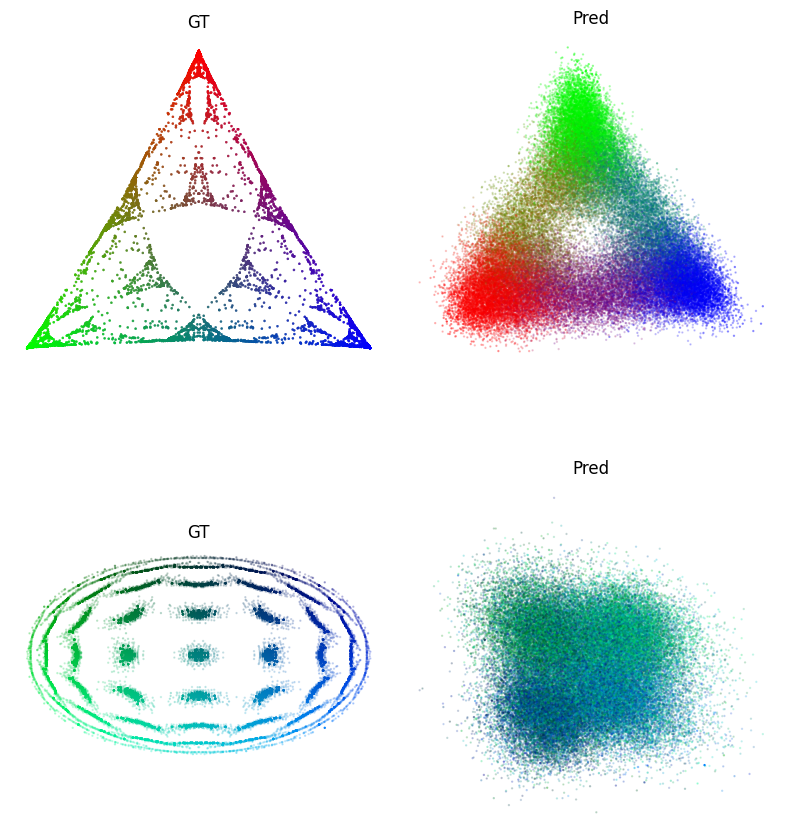

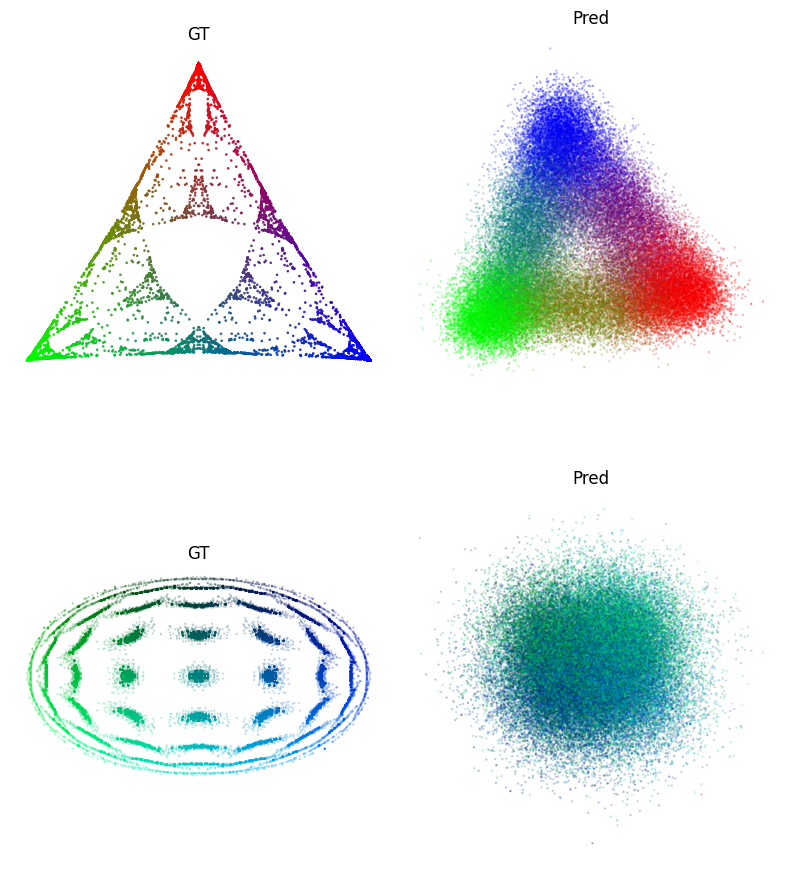

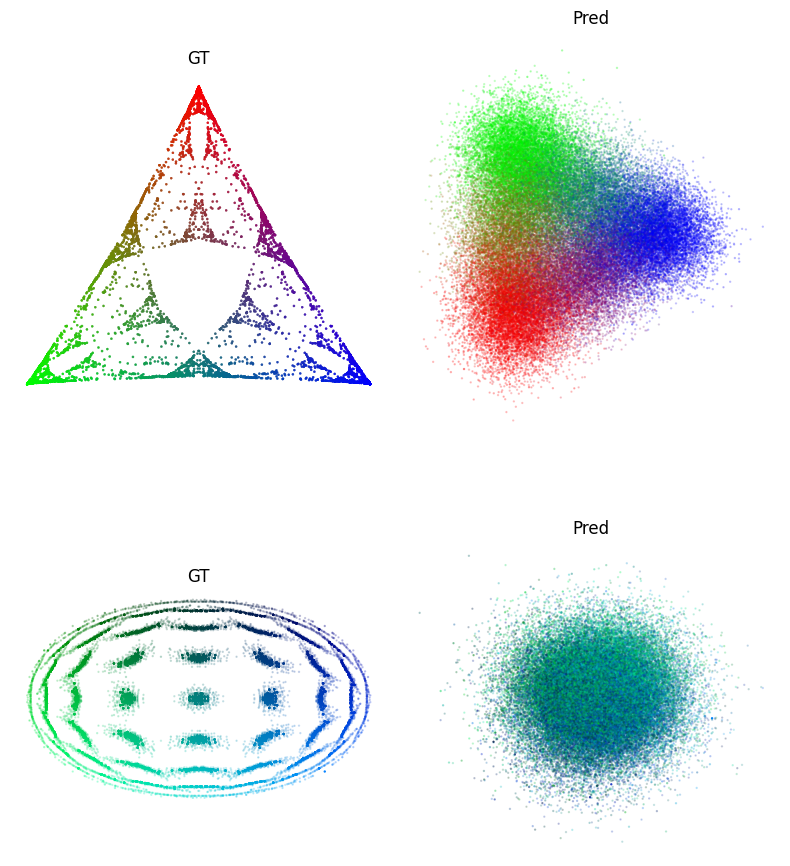

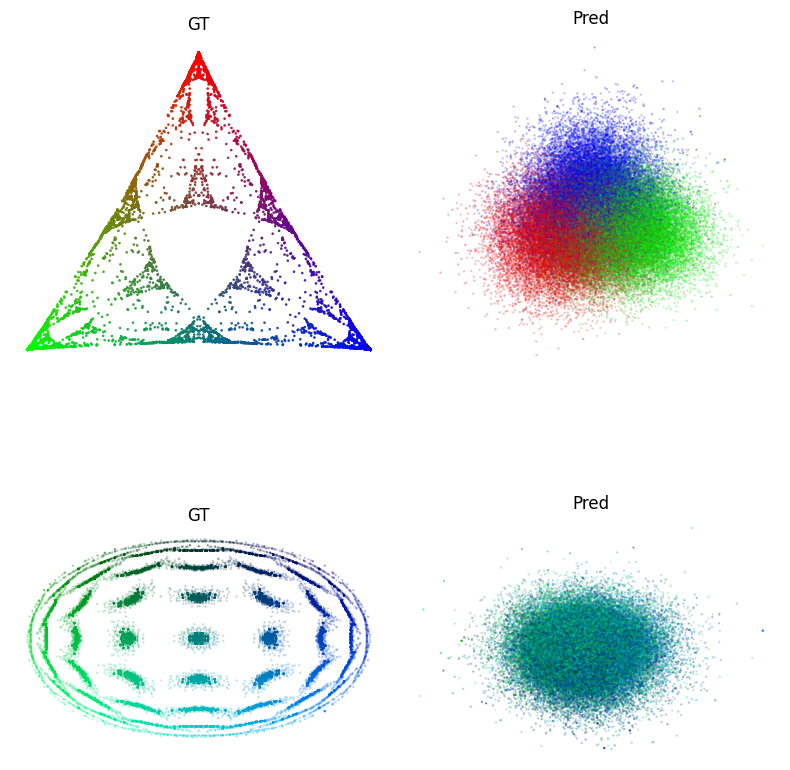

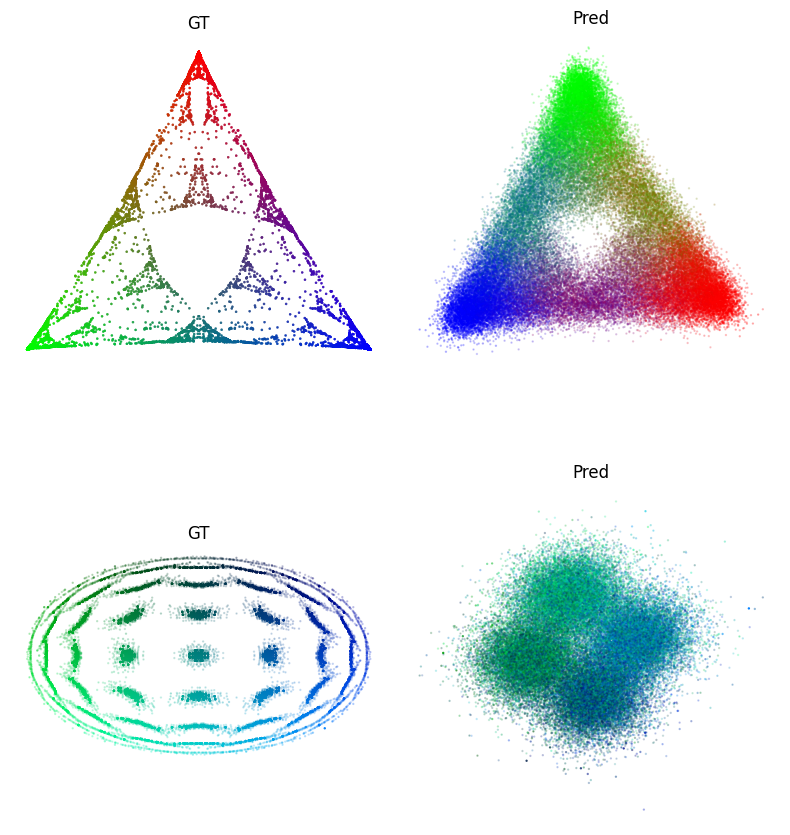

In [124]:
results = run_full_regression_last_token(models[2], X_tokens, Y_beliefs, W_probs, pos=-1)

for layer in results:
    plot_triangle_and_sphere(results[layer], X_tokens, Y_beliefs, W_probs, n_ctx=8)

blocks.0.hook_resid_pre
blocks.0.hook_resid_post
Best rcond from CV: 1e-15, with avg error: 0.357993
Training final model with SVD using rcond=1e-15
blocks.1.hook_resid_post
Best rcond from CV: 1e-15, with avg error: 0.376196
Training final model with SVD using rcond=1e-15
blocks.2.hook_resid_post
Best rcond from CV: 1e-15, with avg error: 0.392300
Training final model with SVD using rcond=1e-15
blocks.3.hook_resid_post
Best rcond from CV: 1e-15, with avg error: 0.406985
Training final model with SVD using rcond=1e-15
ln_final.hook_normalized
combined
Best rcond from CV: 0.00015264179091900587, with avg error: 0.275963
Training final model with SVD using rcond=0.00015264179091900587


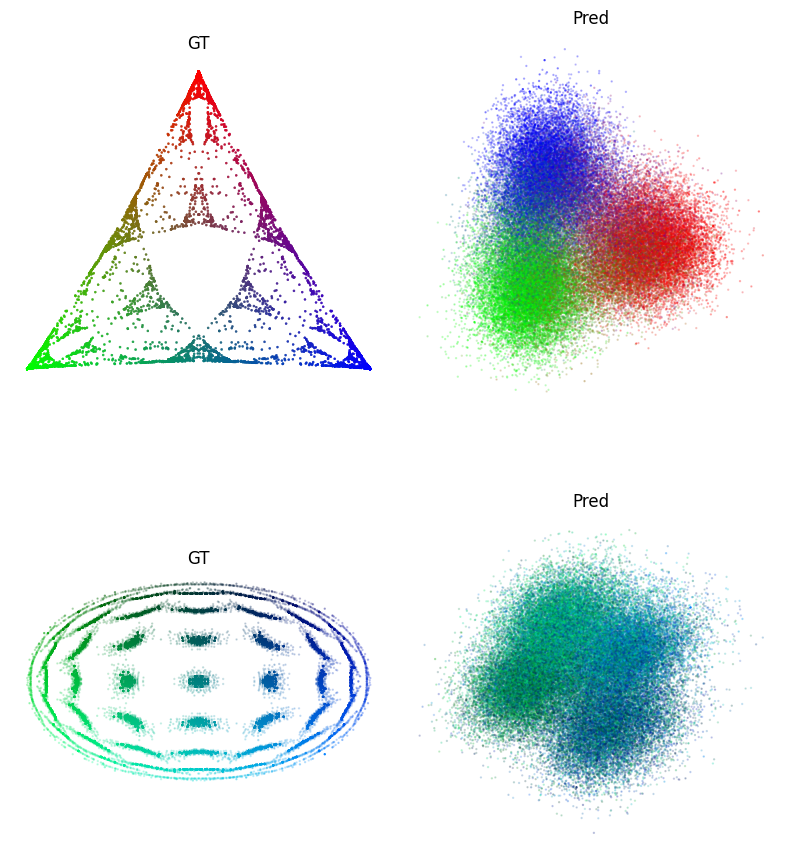

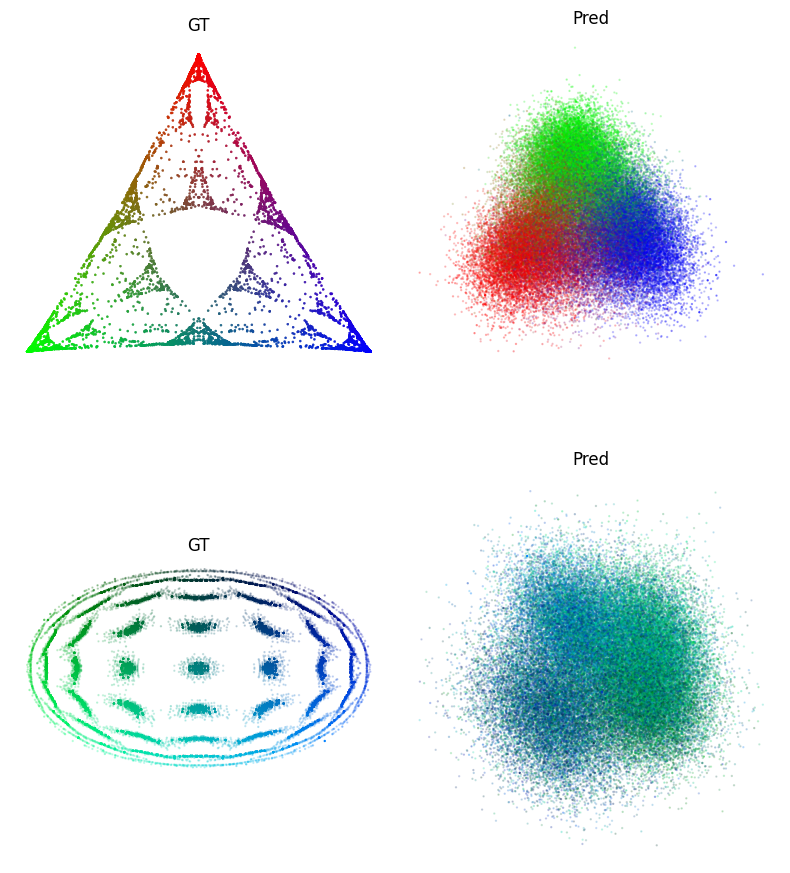

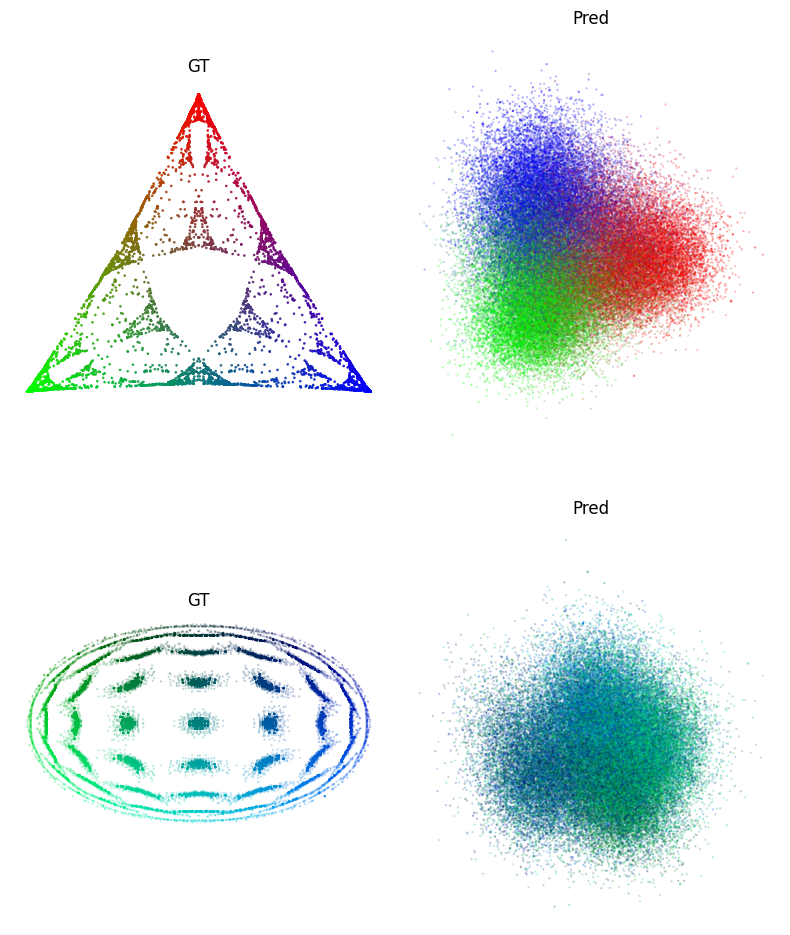

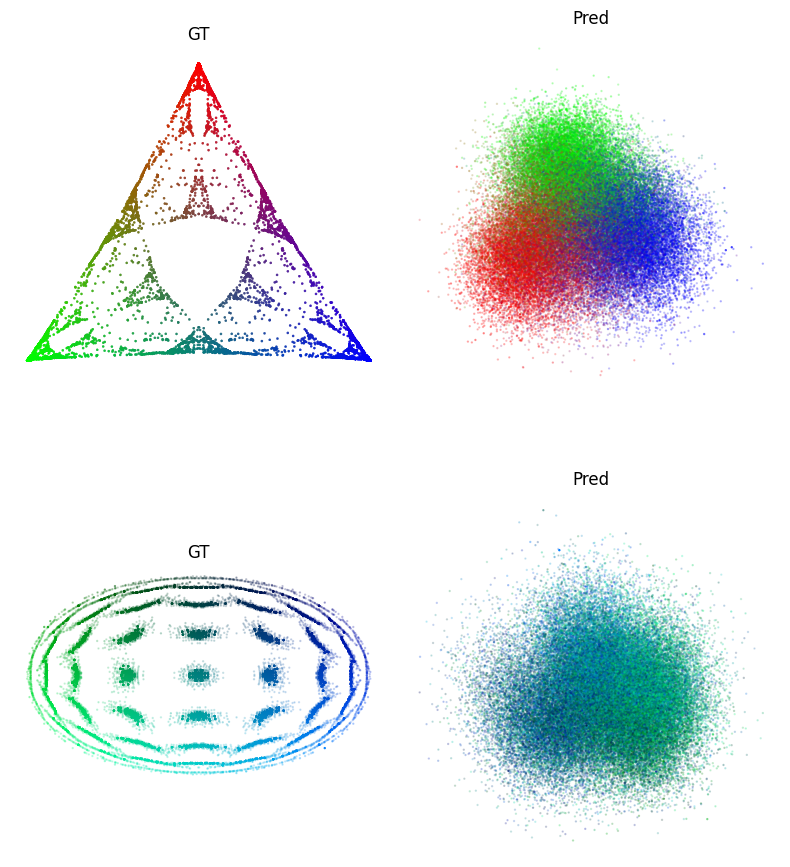

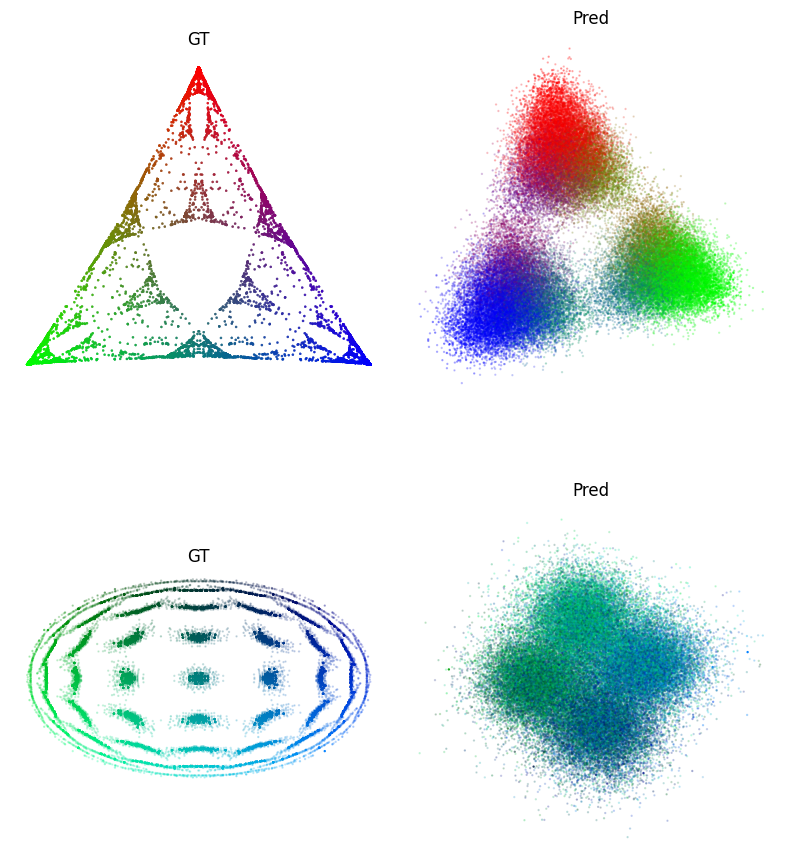

In [125]:
results = run_full_regression_last_token(models[0], X_tokens, Y_beliefs, W_probs, pos=-1)

for layer in results:
    plot_triangle_and_sphere(results[layer], X_tokens, Y_beliefs, W_probs, n_ctx=8)

In [128]:
run_dir = "results/20251023101728/run_0_L4_H4_DH16_DM64_mixture"
models, ckpt_paths = load_model(run_dir, ckpt='first and last')

Moving model to device:  cpu
results/20251023101728/run_0_L4_H4_DH16_DM64_mixture/0.pt
Moving model to device:  cpu
results/20251023101728/run_0_L4_H4_DH16_DM64_mixture/5693849600.pt
Moving model to device:  cpu
results/20251023101728/run_0_L4_H4_DH16_DM64_mixture/983449600.pt


blocks.0.hook_resid_pre
blocks.0.hook_resid_post
Best rcond from CV: 1e-15, with avg error: 0.357993
Training final model with SVD using rcond=1e-15
blocks.1.hook_resid_post
Best rcond from CV: 1e-15, with avg error: 0.376196
Training final model with SVD using rcond=1e-15
blocks.2.hook_resid_post
Best rcond from CV: 1e-15, with avg error: 0.392300
Training final model with SVD using rcond=1e-15
blocks.3.hook_resid_post
Best rcond from CV: 1e-15, with avg error: 0.406985
Training final model with SVD using rcond=1e-15
ln_final.hook_normalized
combined
Best rcond from CV: 0.00015264179091900587, with avg error: 0.275963
Training final model with SVD using rcond=0.00015264179091900587


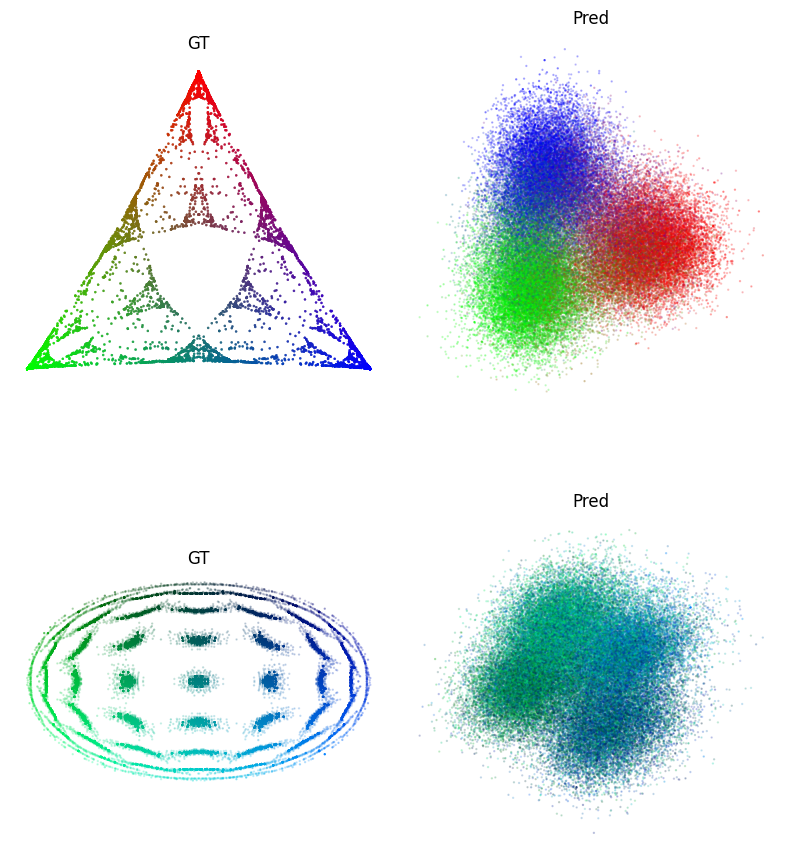

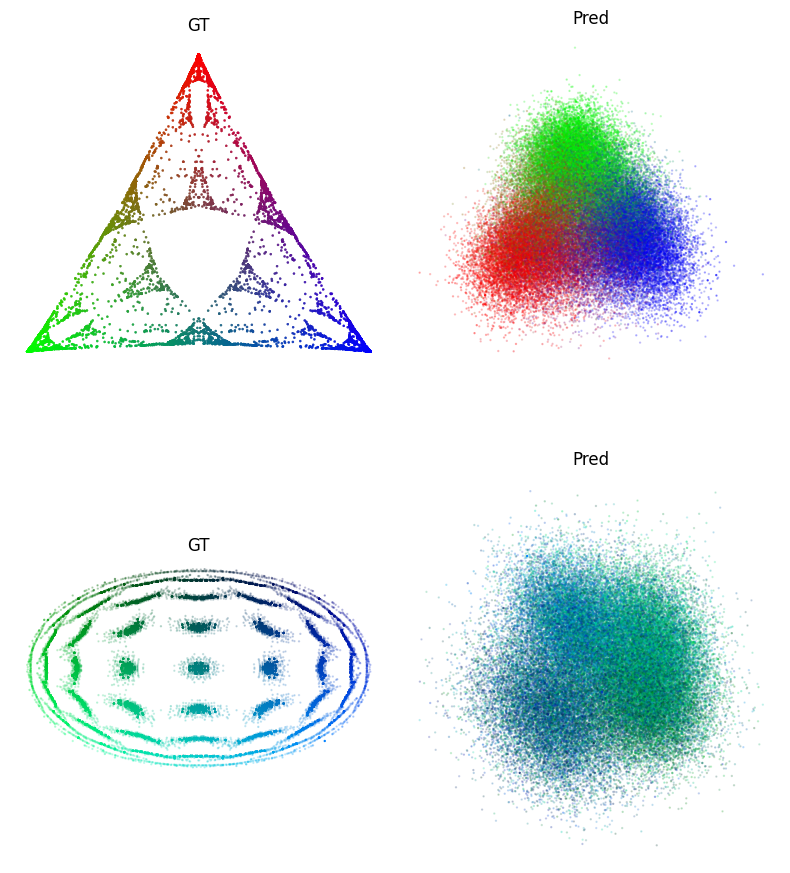

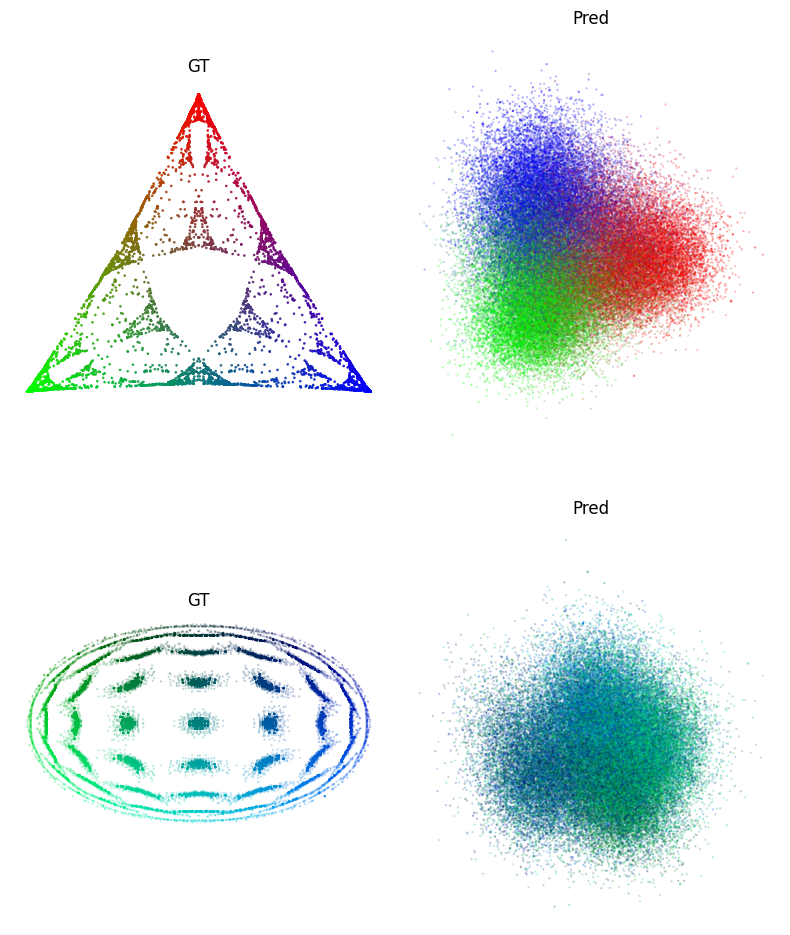

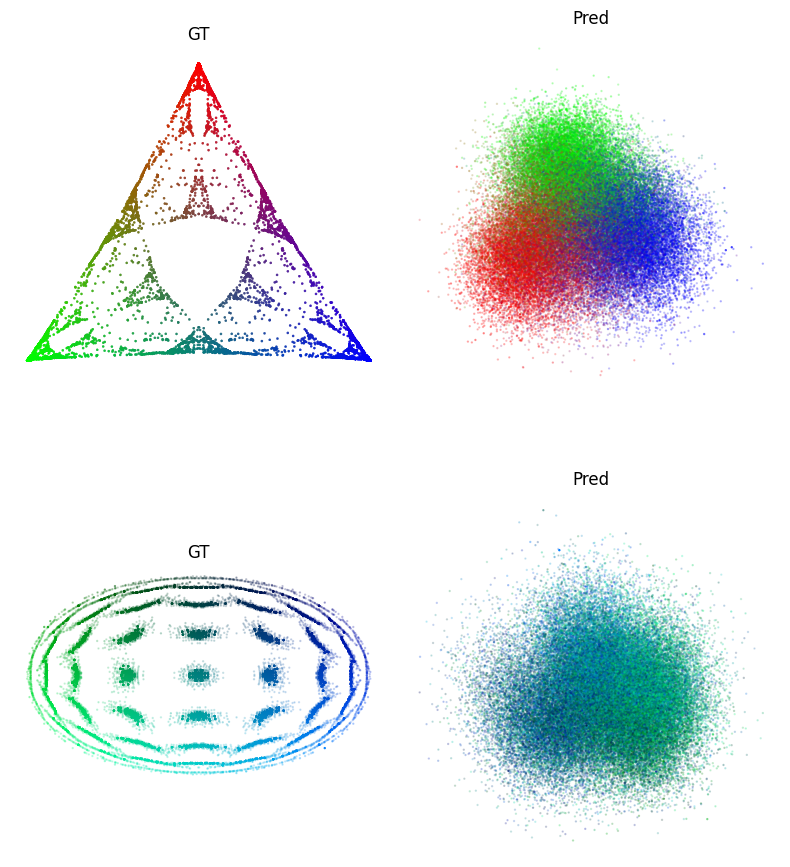

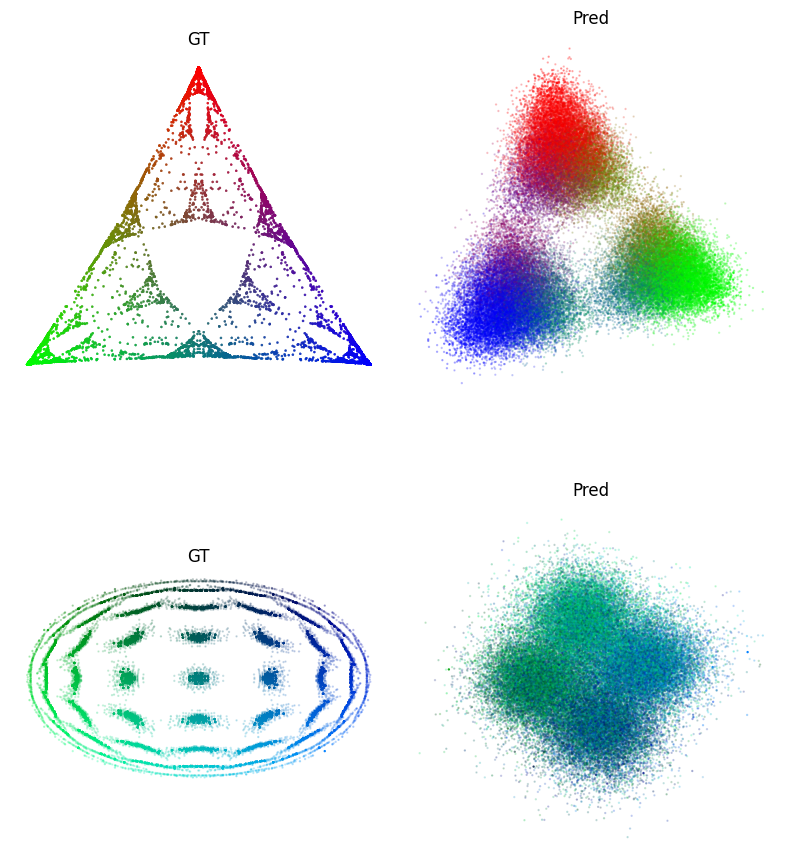

In [129]:
results = run_full_regression_last_token(models[0], X_tokens, Y_beliefs, W_probs, pos=-1)

for layer in results:
    plot_triangle_and_sphere(results[layer], X_tokens, Y_beliefs, W_probs, n_ctx=8)

blocks.0.hook_resid_pre
blocks.0.hook_resid_post
Best rcond from CV: 1e-15, with avg error: 0.261481
Training final model with SVD using rcond=1e-15
blocks.1.hook_resid_post
Best rcond from CV: 1e-15, with avg error: 0.271356
Training final model with SVD using rcond=1e-15
blocks.2.hook_resid_post
Best rcond from CV: 1e-15, with avg error: 0.369359
Training final model with SVD using rcond=1e-15
blocks.3.hook_resid_post
Best rcond from CV: 1e-15, with avg error: 0.534178
Training final model with SVD using rcond=1e-15
ln_final.hook_normalized
combined
Best rcond from CV: 1e-05, with avg error: 0.235417
Training final model with SVD using rcond=1e-05


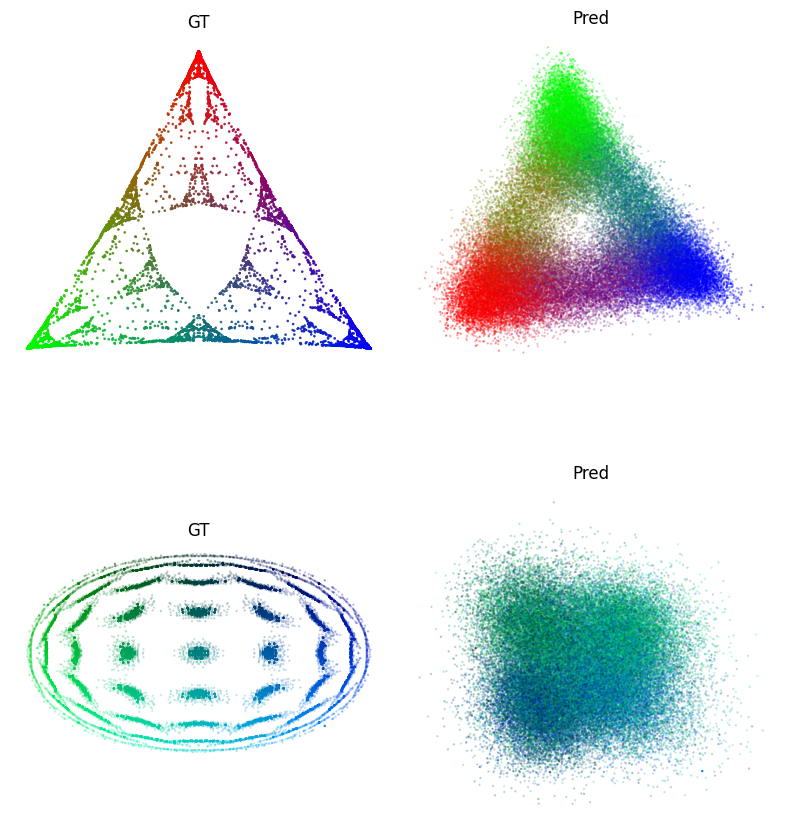

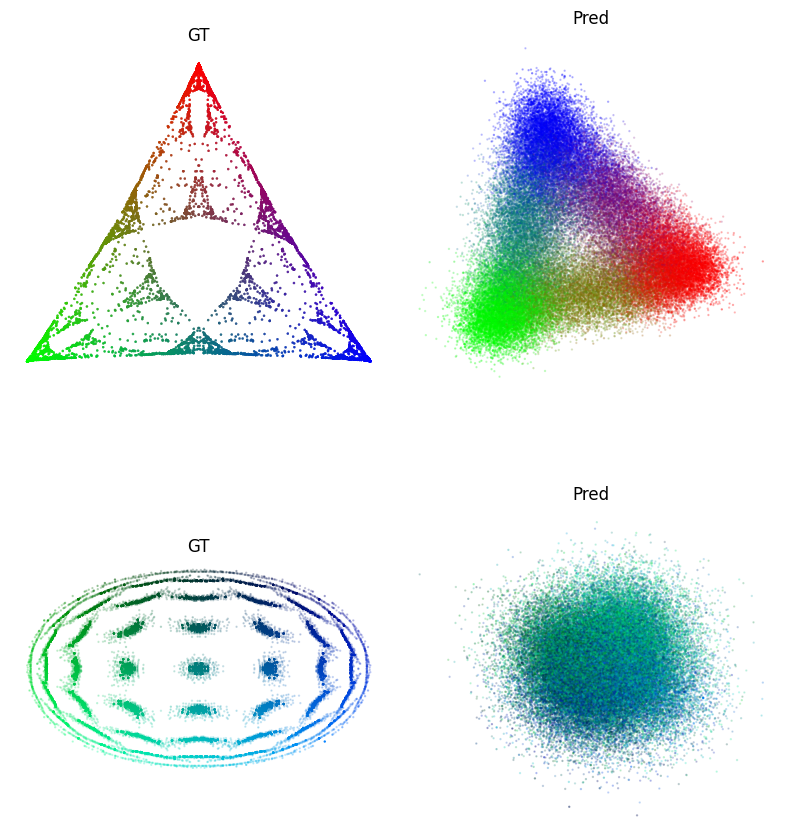

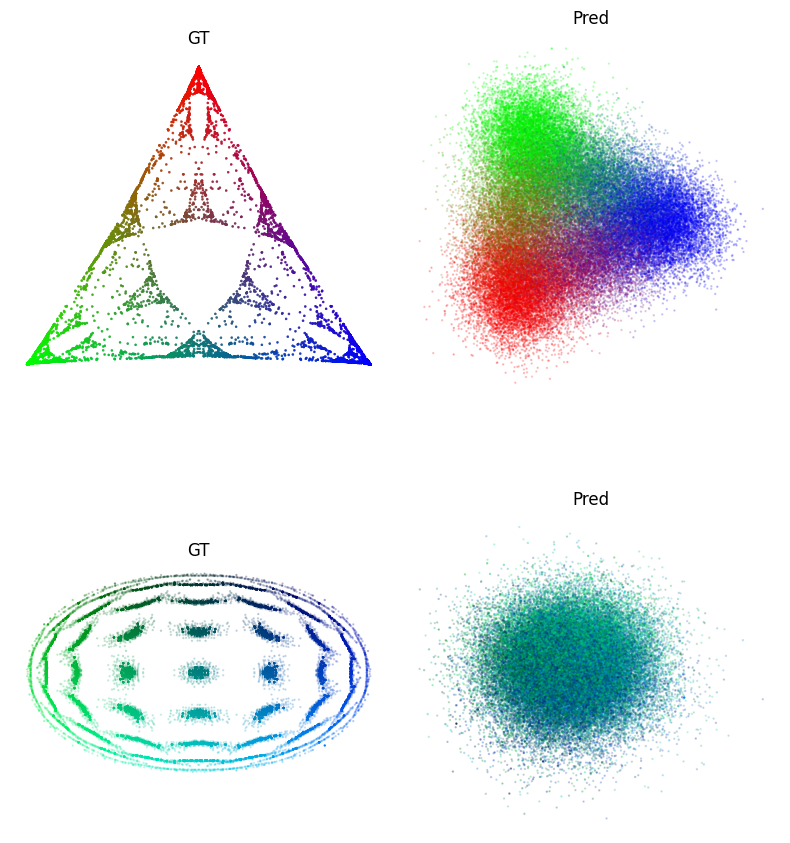

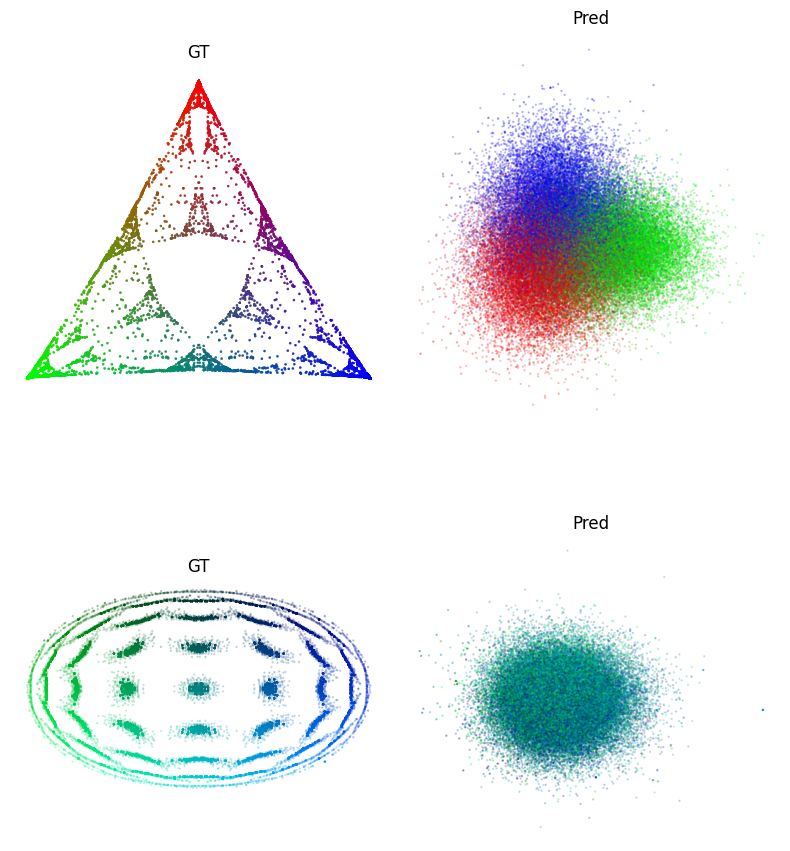

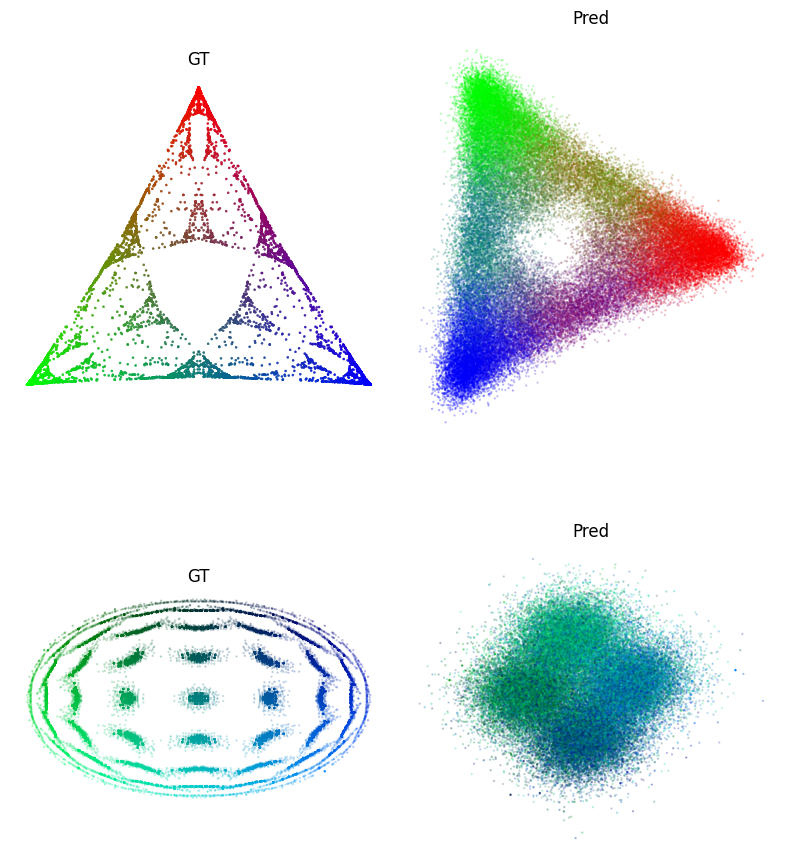

In [130]:
results = run_full_regression_last_token(models[1], X_tokens, Y_beliefs, W_probs, pos=-1)

for layer in results:
    plot_triangle_and_sphere(results[layer], X_tokens, Y_beliefs, W_probs, n_ctx=8)

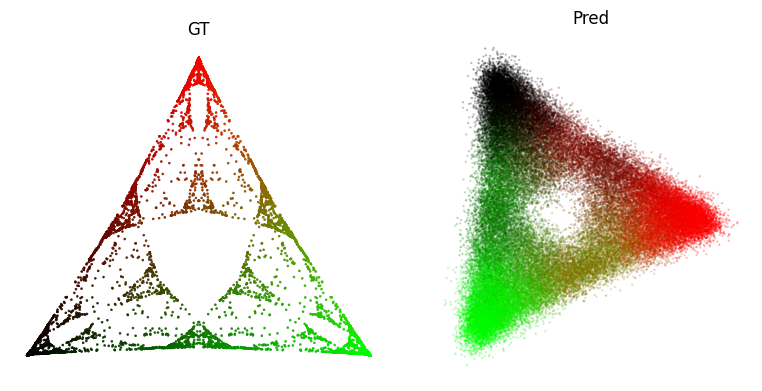

In [136]:
n_ctx = 8
# X_tokens, Y_beliefs, W_probs, _ = gt_to_msp_fixed_ctx(gt_path, n_ctx)
# dedup_probs, dedup_beliefs, _ = deduplicate_data(X_tokens, W_probs, Y_beliefs)
dedup_probs, dedup_beliefs = W_probs, Y_beliefs

# вместо сырых gt_* используем дедуп
beliefs = dedup_beliefs.numpy()    # (U, D)
probs   = dedup_probs.numpy()      # (U,)

# те же функции normalize/alpha/project_to_simplex/PCA
D = beliefs.shape[1]

x_gt, y_gt = project_to_simplex(beliefs[:, :3])
R, G, B = normalize(beliefs[:,0]), normalize(beliefs[:,2]), normalize(beliefs[:,3])

A = alpha_from_probs(probs)
colors = np.stack([R, G, B, A], axis=1)

pred = results[layer]['predicted_beliefs']  # (U, D)
pca = PCA(n_components=4).fit(pred)
x_pred, y_pred = pca.transform(pred)[:,0], pca.transform(pred)[:,1]


fig, axes = plt.subplots(1, 2, figsize=(8, 4))
axes[0].scatter(x_gt, y_gt, s=2.0, c=colors, marker='.', rasterized=True)
axes[0].set_title("GT");   axes[0].set_aspect('equal'); axes[0].axis('off')

axes[1].scatter(x_pred, y_pred, s=2.0, c=colors, marker='.', rasterized=True)
axes[1].set_title("Pred"); axes[1].set_aspect('equal'); axes[1].axis('off')

plt.tight_layout(); plt.show()


# Another Exp - N_CTX 6 and Decart's multiplication

In [1]:
# Честное (без тайлинга) совмещение Mess3 × Bloch с декартовым произведением по каждой длине L.
# Память-сэйф: обрабатываем Bloch блоками и векторизуем tokenizer.encode.

import joblib, numpy as np, torch
from tokenizer import TokenizerMessBloch
from tqdm import tqdm

def group_by_len(indices):
    d = {}
    for i, t in enumerate(indices):
        d.setdefault(len(t), []).append(i)
    return d

def build_joint_gt_cartesian(mess_gt_path, bloch_gt_path, out_path, mode='concat', bloch_block=4096, device='cpu'):
    """
    mess_gt_path, bloch_gt_path: joblib со структурами {'probs','beliefs','indices'}
      - indices: list/array of tuples (L,); beliefs: [N, S_m] и [N, S_b]; probs: [N]
    mode: 'concat' -> beliefs_m || beliefs_b, 'joint' -> кронекер (beliefs_m ⊗ beliefs_b)
    bloch_block: размер блока по Bloch для ограничения пика памяти
    """
    gm = joblib.load(mess_gt_path)
    gb = joblib.load(bloch_gt_path)

    tok = TokenizerMessBloch()
    pieces_probs, pieces_bel, pieces_inds = [], [], []

    gm_byL = group_by_len(gm['indices'])
    gb_byL = group_by_len(gb['indices'])

    common_lengths = [6]
    for L in common_lengths:
        mi = gm_byL[L]  # индексы Mess длины L
        bi = gb_byL[L]  # индексы Bloch длины L
        if not mi or not bi:
            continue

        # берём подмножества
        Pm = gm['probs'][mi].astype(np.float32)
        Pb = gb['probs'][bi].astype(np.float32)
        # нормализуем отдельно на всякий случай (гарантия сумм = 1 для длины L)
        Pm = Pm / Pm.sum()
        Pb = Pb / Pb.sum()

        M = len(mi); B = len(bi)
        # тензоры путей для L
        Xm = torch.tensor(np.stack([gm['indices'][k] for k in mi], axis=0), dtype=torch.long)  # [M, L]
        Xb_all = torch.tensor(np.stack([gb['indices'][k] for k in bi], axis=0), dtype=torch.long)  # [B, L]

        # beliefs (размерности определяем динамически)
        Bel_m = gm['beliefs'][mi].astype(np.float32)  # [M, S_m]
        Bel_b = gb['beliefs'][bi].astype(np.float32)  # [B, S_b]
        S_m = Bel_m.shape[1]
        S_b = Bel_b.shape[1]

        # идём по блокам Bloch, собираем части
        for start in tqdm(range(0, B, bloch_block)):
            end = min(start + bloch_block, B)
            Xb = Xb_all[start:end]                   # [Bb, L]
            Pb_blk = Pb[start:end]                  # [Bb]
            Bb = Xb.shape[0]

            # декартово произведение M×Bb
            Xm_rep = Xm.repeat_interleave(Bb, dim=0)          # [M*Bb, L]
            Xb_rep = Xb.repeat(M, 1)                           # [M*Bb, L]

            # кодируем пары
            joint_tokens = tok.encode(Xm_rep, Xb_rep).to(device)  # [M*Bb, L]

            # веса: внешнее произведение и flat
            P_joint_blk = (Pm[:, None] * Pb_blk[None, :]).reshape(-1).astype(np.float32)  # [M*Bb]

            # beliefs:
            if mode == 'joint':
                # кронекер по всем парам: [M,Bb,S_m*S_b]
                # делаем блоково, без гигантских матриц
                bel_m_rep = np.repeat(Bel_m, Bb, axis=0)        # [M*Bb, S_m]
                bel_b_rep = np.tile(Bel_b[start:end], (M, 1))   # [M*Bb, S_b]
                bel_blk = (bel_m_rep[:, :, None] * bel_b_rep[:, None, :]).reshape(-1, S_m * S_b).astype(np.float32)
            else:
                # concat: [M*Bb, S_m + S_b]
                bel_m_rep = np.repeat(Bel_m, Bb, axis=0)        # [M*Bb, S_m]
                bel_b_rep = np.tile(Bel_b[start:end], (M, 1))   # [M*Bb, S_b]
                bel_blk = np.concatenate([bel_m_rep, bel_b_rep], axis=1).astype(np.float32)

            # индексы как tuple
            inds_blk = [tuple(row.tolist()) for row in joint_tokens.cpu().numpy()]  # list of tuples

            pieces_probs.append(P_joint_blk)
            pieces_bel.append(bel_blk)
            pieces_inds.append(np.array(inds_blk, dtype=object))

    # склейка и нормировка
    probs_all = np.concatenate(pieces_probs, axis=0)
    probs_all = (probs_all / probs_all.sum()).astype(np.float32)
    beliefs_all = np.concatenate(pieces_bel, axis=0).astype(np.float32)
    indices_all = np.concatenate(pieces_inds, axis=0)

    out = {'probs': probs_all, 'beliefs': beliefs_all, 'indices': indices_all}
    return out

In [2]:
# пример вызова:
out = build_joint_gt_cartesian(
  "target_result/run_0_L2_H2_DH16_DM32_mixture/mess3_ground_truth_data.joblib",
  "target_result/run_0_L2_H2_DH16_DM32_mixture/tom_quantum_ground_truth_data.joblib",
  "target_result/run_0_L2_H2_DH16_DM32_mixture/mixture_ground_truth_data.joblib",
  mode='concat'  # или 'joint'
)
# save_gt(out, "target_result/run_0_L2_H2_DH16_DM32_mixture/mixture_ground_truth_data.joblib")

100%|████████████████████████████████████████████████| 1/1 [00:01<00:00,  1.18s/it]


In [6]:

save_gt(out, "target_result/run_0_L2_H2_DH16_DM32_mixture/mixture_ground_truth_data_6.joblib")

Saved: target_result/run_0_L2_H2_DH16_DM32_mixture/mixture_ground_truth_data_6.joblib


In [1]:
gt_path = "target_result/run_0_L2_H2_DH16_DM32_mixture/mixture_ground_truth_data_6.joblib"

In [3]:
from plot_utils import gt_to_msp_fixed_ctx, load_model
from regression import run_full_regression_last_token

X_tokens, Y_beliefs, W_probs, _ = gt_to_msp_fixed_ctx(gt_path, 6)  # X:[N,L], Y:[N,S] или [N,L,S], W:[N]

run_dir = "results/20251023194824/run_0_L4_H4_DH16_DM64_mixture"
models, ckpt_paths = load_model(run_dir, ckpt='first and last')

results = run_full_regression_last_token(models[0], X_tokens, Y_beliefs, W_probs, pos=-1)

TypeError: empty() received an invalid combination of arguments - got (int, int, dtype=str), but expected one of:
 * (tuple of ints size, *, tuple of names names, torch.memory_format memory_format = None, torch.dtype dtype = None, torch.layout layout = None, torch.device device = None, bool pin_memory = False, bool requires_grad = False)
 * (tuple of ints size, *, torch.memory_format memory_format = None, Tensor out = None, torch.dtype dtype = None, torch.layout layout = None, torch.device device = None, bool pin_memory = False, bool requires_grad = False)


In [ ]:
for layer in results:
    plot_triangle_and_sphere(results[layer], X_tokens, Y_beliefs, W_probs, n_ctx=8)

In [19]:
import joblib, numpy as np, matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from pathlib import Path
import os

results = run_full_regression_last_token(models[0], X_tokens, Y_beliefs, W_probs, pos=-1, device='cuda:2')

blocks.0.hook_resid_pre
blocks.0.hook_resid_post


RuntimeError: Expected all tensors to be on the same device, but found at least two devices, cuda:2 and cpu!

In [75]:
torch.cuda.empty_cache()
gc.collect()

31952

In [76]:
device = 'cuda:2'
model, X_tokens, Y_beliefs, W_probs, pos = models[1], X_tokens, Y_beliefs, W_probs, -1
Yb = torch.as_tensor(Y_beliefs, dtype=torch.float32, device=device)
W = torch.as_tensor(W_probs, dtype=torch.float32, device=device)  # [N]

nn_acts = get_acts(model, X_tokens, device)
save_data = {}

In [77]:
def regression(X, Y, W, device):
    res = run_activation_to_beliefs_regression_single(
        X, Y, W,
        device=device
    )
    torch.cuda.empty_cache()
    gc.collect()
    return  {
        'predicted_beliefs': res['predictions'],
        'rmse':  res['final_metrics']['rmse'],
        'mae':   res['final_metrics']['mae'],
        'r2':    res['final_metrics']['r2'],
        'dist':  res['final_metrics']['dist'],
        'mse':   res['final_metrics']['mse'],
        'cum_var_exp': None, 'cum_var_exp_zscore': None,
        'val_loss_mean': float('nan'),
    }

In [52]:
for layer, X in tqdm(nn_acts.items()):
    print(layer)
    if ("post" in layer) or ('combined' in layer):
        save_data[layer] = regression(X[:, pos, :].to(device), Yb, W, device=device)
        print("RMSE:", save_data[layer]["rmse"])

  0%|                                                        | 0/7 [00:00<?, ?it/s]

blocks.0.hook_resid_pre
blocks.0.hook_resid_post


 29%|█████████████▋                                  | 2/7 [00:00<00:01,  3.03it/s]

RMSE: 0.31726720929145813
blocks.1.hook_resid_post


 43%|████████████████████▌                           | 3/7 [00:01<00:02,  1.86it/s]

RMSE: 0.34849247336387634
blocks.2.hook_resid_post


 57%|███████████████████████████▍                    | 4/7 [00:02<00:01,  1.51it/s]

RMSE: 0.3565613925457001
blocks.3.hook_resid_post


 71%|██████████████████████████████████▎             | 5/7 [00:03<00:01,  1.38it/s]

RMSE: 0.3634908199310303
ln_final.hook_normalized
combined


100%|████████████████████████████████████████████████| 7/7 [00:05<00:00,  1.38it/s]

RMSE: 0.2390669286251068


In [78]:
for layer, X in tqdm(nn_acts.items()):
    print(layer)
    if ("post" in layer) or ('combined' in layer):
        save_data[layer] = regression(X[:, pos, :].to(device), Yb, W, device=device)
        print("RMSE:", save_data[layer]["rmse"])

  0%|                                                        | 0/7 [00:00<?, ?it/s]

blocks.0.hook_resid_pre
blocks.0.hook_resid_post


 29%|█████████████▋                                  | 2/7 [00:01<00:02,  1.71it/s]

RMSE: 0.1830226480960846
blocks.1.hook_resid_post


 43%|████████████████████▌                           | 3/7 [00:01<00:02,  1.48it/s]

RMSE: 0.1305115818977356
blocks.2.hook_resid_post


 57%|███████████████████████████▍                    | 4/7 [00:02<00:02,  1.39it/s]

RMSE: 0.12588684260845184
blocks.3.hook_resid_post


 71%|██████████████████████████████████▎             | 5/7 [00:03<00:01,  1.33it/s]

RMSE: 0.12464533746242523
ln_final.hook_normalized
combined


100%|████████████████████████████████████████████████| 7/7 [00:05<00:00,  1.29it/s]

RMSE: 0.12175825983285904


In [79]:
import matplotlib as mpl
mpl.use('Agg')  # неинтерактивный
mpl.rcParams['path.simplify'] = True
mpl.rcParams['path.simplify_threshold'] = 0.5
mpl.rcParams['agg.path.chunksize'] = 10000

In [43]:
import torch
import math

@torch.no_grad()
def run_activation_to_beliefs_regression_single(activations, beliefs, probs, rcond_values=(1e-6, 1e-5, 1e-4),
                                                batch_size=131072, device='cuda'):
    """
    Однопроходная взвешенная регрессия без KFold.
    - activations: [N, D] или [N, L, D] (тогда берётся последний токен)
    - beliefs:     [N, S] или [N, L, S] (берётся последний токен при 3D)
    - probs:       [N]    (веса примеров)
    Возвращает dict совместимый с кодом анализа: 
      {'predictions': Yhat, 'final_metrics': {...}, 'rcond': best_rcond, 'beta': beta}
    """
    # 1) Приводим к 2D [N, D] и [N, S]
    X = activations
    Y = beliefs
    if X.dim() == 3:
        X = X[:, -1, :]
    if Y.dim() == 3:
        Y = Y[:, -1, :]
    X = X.contiguous().float()
    Y = Y.contiguous().float()
    w = probs.contiguous().float()

    N, D = X.shape
    S = Y.shape[1]
    dev = torch.device(device)

    # 2) Стримим X' = [1, X]: аккумулируем XtX и XtY
    XtX = torch.zeros(D+1, D+1, device=dev, dtype=torch.float32)
    XtY = torch.zeros(D+1, S,   device=dev, dtype=torch.float32)
    for s in range(0, N, batch_size):
        e = min(s+batch_size, N)
        Xc = X[s:e].to(dev, non_blocking=True)
        Yc = Y[s:e].to(dev, non_blocking=True)
        wc = w[s:e].to(dev, non_blocking=True).clamp_min_(0)
        Wsqrt = wc.sqrt().unsqueeze(1)                         # [B,1]
        Xc_bias = torch.cat([torch.ones(Xc.size(0), 1, device=dev), Xc], dim=1)  # [B, D+1]
        Xw = Xc_bias * Wsqrt
        Yw = Yc * Wsqrt
        XtX += Xw.T @ Xw
        XtY += Xw.T @ Yw

    # 3) SVD одного XtX; решаем для нескольких rcond, выбираем лучший по weighted MSE (на всём наборе)
    U, Svals, Vh = torch.linalg.svd(XtX, full_matrices=False)
    best = None
    best_obj = math.inf
    best_pred = None

    # подготовим предсказания в потоке (без хранения X целиком в памяти)
    def predict_stream(beta):
        Yhat = torch.empty(N, S, dtype=torch.float32, device=dev)
        for s in range(0, N, batch_size):
            e = min(s+batch_size, N)
            Xc = X[s:e].to(dev, non_blocking=True)
            Xc_bias = torch.cat([torch.ones(Xc.size(0), 1, device=dev), Xc], dim=1)
            Yhat[s:e] = Xc_bias @ beta
        return Yhat

    # предвычислим weighted базовые величины для метрик
    w_sum = w.sum().to(dev)
    y_mean = (Y.to(dev) * w.to(dev).unsqueeze(1)).sum(dim=0) / w_sum
    var_denom = ((Y.to(dev) - y_mean.unsqueeze(0)).pow(2).sum(dim=1) * w.to(dev)).sum() / w_sum

    for rcond in rcond_values:
        thr = rcond * Svals.max()
        Sinv = torch.where(Svals > thr, 1.0 / Svals, torch.zeros_like(Svals))
        pinv_XtX = (Vh.transpose(0,1) * Sinv) @ U.transpose(0,1)
        beta = pinv_XtX @ XtY  # [D+1, S]

        Yhat = predict_stream(beta)
        diff = Yhat - Y.to(dev)
        mse = ((diff.pow(2).sum(dim=1) * w.to(dev))).sum() / w_sum
        if mse.item() < best_obj:
            best_obj = mse.item()
            best = (rcond, beta)
            best_pred = Yhat

    rcond_best, beta_best = best
    Yhat = best_pred

    # 4) Метрики (взвешенные)
    diff = Yhat - Y.to(dev)
    mse = ((diff.pow(2).sum(dim=1) * w.to(dev))).sum() / w_sum
    rmse = mse.sqrt()
    mae = ((diff.abs().sum(dim=1) * w.to(dev))).sum() / w_sum
    dist = ((diff.norm(dim=1) * w.to(dev))).sum() / w_sum
    r2 = 1.0 - (mse / var_denom.clamp_min(1e-12))

    return {
        'predictions': Yhat,  # [N, S] (device=dev)
        'final_metrics': {
            'rmse': rmse.item(),
            'mae':  mae.item(),
            'r2':   r2.item(),
            'dist': dist.item(),
            'mse':  mse.item(),
        },
        'rcond': rcond_best,
        'beta': beta_best,     # [D+1, S]
    }

In [88]:
def plot_triangle_and_sphere(result, X_tokens, Y_beliefs, W_probs):
    pred = result['predicted_beliefs'].cpu()  # (U, D)
    pca = PCA(n_components=4).fit(pred.cpu())
        
    beliefs = Y_beliefs.numpy()    # (U, D)
    probs   = W_probs.numpy()      # (U,)
    
    A = alpha_from_probs(probs)
    
    fig, axes = plt.subplots(2, 2, figsize=(8, 10), constrained_layout=True, sharex=True, sharey=True)
    for item in tqdm(range(2)):

        add = 3 * item
        x_gt, y_gt = project_to_simplex(beliefs[:, 0 + add: 3 + add])
        x_pred, y_pred = pca.transform(pred)[:,0 + 2 * item], pca.transform(pred)[:,1 + 2 * item]
        
        R, G, B = normalize(beliefs[:, 0 + add]), normalize(beliefs[:, 1+ add]), normalize(beliefs[:, 2 + add])
        colors = np.stack([R, G, B, A], axis=1)
            
        ax = axes[item][0]
        ax.scatter(x_gt, y_gt, s=2.0, c=colors, marker='.', rasterized=True)
        ax.set_title("GT");   ax.set_aspect('equal'); ax.axis('off')
        
        ax = axes[item][1]
        ax.scatter(x_pred, y_pred, s=2.0, c=colors, marker='.', rasterized=True)
        ax.set_title("Pred"); ax.set_aspect('equal'); ax.axis('off')
        
    # plt.tight_layout()
    plt.savefig("out.png", dpi=150)  # быстрее, чем tight_layout()+show()
    plt.close(fig)


In [90]:
result, X_tokens, Y_beliefs, W_probs = save_data["combined"], X_tokens, Y_beliefs, W_probs

pred = result['predicted_beliefs'].cpu()  # (U, D)
pca = PCA(n_components=4).fit(pred.cpu())
    
beliefs = Y_beliefs.numpy()    # (U, D)
probs   = W_probs.numpy()      # (U,)

A = alpha_from_probs(probs)

fig, axes = plt.subplots(2, 2, figsize=(8, 10), constrained_layout=True, sharex=True, sharey=True)
for item in tqdm(range(2)):

    add = 3 * item
    x_gt, y_gt = project_to_simplex(beliefs[:, 0 + add: 3 + add])
    x_pred, y_pred = pca.transform(pred)[:,0 + 2 * item], pca.transform(pred)[:,1 + 2 * item]
    
    R, G, B = normalize(beliefs[:, 0 + add]), normalize(beliefs[:, 1+ add]), normalize(beliefs[:, 2 + add])
    colors = np.stack([R, G, B, A], axis=1)
        
    ax = axes[item][0]
    ax.scatter(x_gt, y_gt, s=2.0, c=colors, marker='.', rasterized=True)
    ax.set_title("GT");   ax.set_aspect('equal'); ax.axis('off')
    
    ax = axes[item][1]
    ax.scatter(x_pred, y_pred, s=2.0, c=colors, marker='.', rasterized=True)
    ax.set_title("Pred"); ax.set_aspect('equal'); ax.axis('off')

100%|████████████████████████████████████████████████| 2/2 [00:01<00:00,  1.34it/s]


In [91]:
plt.savefig("out.png", dpi=150)  # быстрее, чем tight_layout()+show()
plt.close(fig)

KeyboardInterrupt: 

In [94]:
import numpy as np

def weighted_reservoir_sample_indices(probs, k, rng=None):
    # probs: 1D np.array >0 (не нужно нормировать)
    rng = np.random.default_rng(rng)
    u = rng.random(len(probs))
    # ключи в лог-форме: key = log(u)/w, берём k наибольших (меньше по модулю отриц.)
    keys = np.log(u) / probs
    idx = np.argpartition(keys, kth=-k)[-k:]  # без полной сортировки
    # опционально отсортировать по ключам (не обязательно)
    return idx

In [108]:
pred = result['predicted_beliefs'].float().cpu()
beliefs = torch.as_tensor(Y_beliefs).float().cpu()
probs   = torch.as_tensor(W_probs).float().cpu()
probs = probs / probs.sum()

# Взвешенная выборка до K точек (например 100k)
K = min(100_000, pred.shape[0])

idx = weighted_reservoir_sample_indices(probs.numpy().astype(np.float32), k=1000_000)
# X_sub = X[idx]; colors_sub = colors[idx]

In [ ]:
result, X_tokens, Y_beliefs, W_probs = save_data["combined"], X_tokens, Y_beliefs, W_probs


In [97]:
import numpy as np, torch, matplotlib as mpl, matplotlib.pyplot as plt
from sklearn.decomposition import PCA

mpl.use('Agg')  # неинтерактивный бекенд быстрее
mpl.rcParams['path.simplify'] = True
mpl.rcParams['path.simplify_threshold'] = 0.5
mpl.rcParams['agg.path.chunksize'] = 10000

pred = result['predicted_beliefs'].float().cpu()
beliefs = torch.as_tensor(Y_beliefs).float().cpu()
probs   = torch.as_tensor(W_probs).float().cpu()
probs = probs / probs.sum()

idx = weighted_reservoir_sample_indices(probs.numpy().astype(np.float32), k=1000_000)
pred_s = pred[idx].numpy().astype(np.float32)
bel_s  = beliefs[idx].numpy().astype(np.float32)
pr_s   = probs[idx].numpy().astype(np.float32)

# Один PCA-прогон
pca = PCA(n_components=4).fit(pred_s)
Z = pca.transform(pred_s)  # [K, 4]



In [101]:
# взвешенный сабсэмплинг + один PCA и отрисовка только по подмножеству
# предполагается, что weighted_reservoir_sample_indices(probs, k) уже определена

result, X_tokens, Y_beliefs, W_probs = save_data["combined"], X_tokens, Y_beliefs, W_probs

pred = result['predicted_beliefs'].cpu()                  # [U, D]
beliefs = Y_beliefs.numpy().astype(np.float32)            # [U, S]
probs = W_probs.numpy().astype(np.float32)                # [U]

K = min(100_000, len(probs))
idx = weighted_reservoir_sample_indices(probs, k=K)       # np.ndarray [K]

pred_s = pred[idx].numpy().astype(np.float32)             # [K, D]
bel_s  = beliefs[idx]                                     # [K, S]
pr_s   = probs[idx]                                       # [K]

A = alpha_from_probs(pr_s)                                # [K]

# один PCA на подмножестве
pca = PCA(n_components=4).fit(pred_s)
Z = pca.transform(pred_s)                                 # [K, 4]

fig, axes = plt.subplots(2, 2, figsize=(8, 10), constrained_layout=True, sharex=True, sharey=True)
for item in range(2):
    add = 3 * item
    x_gt, y_gt = project_to_simplex(bel_s[:, 0+add: 3+add])

    x_pred = Z[:, 0 + 2*item]
    y_pred = Z[:, 1 + 2*item]

    R = normalize(bel_s[:, 0+add]); G = normalize(bel_s[:, 1+add]); B = normalize(bel_s[:, 2+add])
    colors = np.stack([R, G, B, A], axis=1).astype(np.float32)

    ax = axes[item][0]
    ax.scatter(x_gt, y_gt, s=2.0, c=colors, marker='.', rasterized=True)
    ax.set_title("GT");   ax.set_aspect('equal'); ax.axis('off')

    ax = axes[item][1]
    ax.scatter(x_pred, y_pred, s=2.0, c=colors, marker='.', rasterized=True)
    ax.set_title("Pred"); ax.set_aspect('equal'); ax.axis('off')

# лучше сохранять, чем show (быстрее и без блокировок)
plt.savefig("scatter_sampled.png", dpi=150)
plt.close(fig)

In [89]:
for layer in save_data:
    plot_triangle_and_sphere(save_data[layer], X_tokens, Y_beliefs, W_probs)

100%|████████████████████████████████████████████████| 2/2 [00:01<00:00,  1.35it/s]


KeyboardInterrupt: 

Error in callback <function _draw_all_if_interactive at 0x7f32e1dd4cc0> (for post_execute), with arguments args (),kwargs {}:


KeyboardInterrupt: 

In [102]:
import matplotlib.pyplot as plt
plt.ion()

In [109]:
bel_s  = beliefs[idx].numpy().astype(np.float32)
pca = PCA(n_components=4).fit(bel_s)


In [110]:
xy  = pca.transform(bel_s)
x_gt, y_gt = xy[:,0], xy[:,1]
R, G = normalize(x_gt), normalize(y_gt)
B    = normalize(np.sqrt(x_gt**2 + y_gt**2))

In [111]:
x_gt

array([ 0.29831177, -0.6198845 , -0.10886613, ...,  0.74513716,
        0.7450297 ,  0.745011  ], shape=(1000000,), dtype=float32)

In [115]:
import matplotlib
# matplotlib.use('TkAgg')   # или 'Qt5Agg' / 'module://matplotlib_inline.backend_inline'
import matplotlib.pyplot as plt

In [117]:
gc.collect()

40494

In [119]:
import matplotlib
matplotlib.use('module://matplotlib_inline.backend_inline')
import matplotlib.pyplot as plt

In [121]:
plt.plot(x_gt[:100], y_gt[:100])
# plt.tight_layout()
plt.show()

KeyboardInterrupt: 

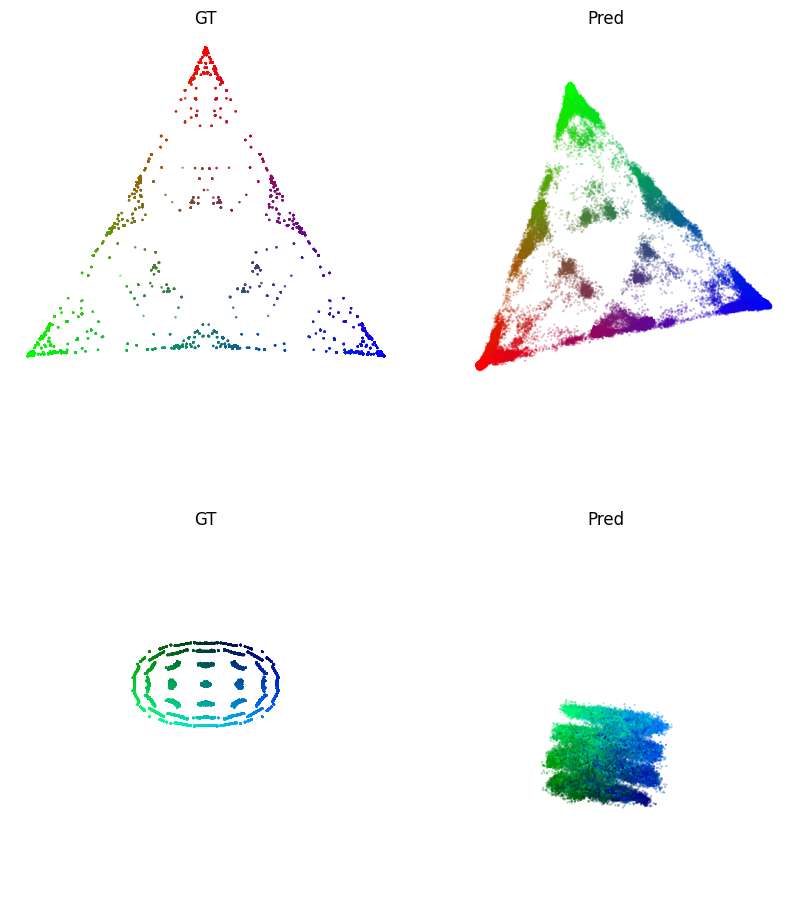

In [120]:
from IPython.display import display
display(fig)

In [106]:
D = gt_beliefs.shape[1]
if use_simplex_if_3d and D >= 3:
    x_gt, y_gt = project_to_simplex(gt_beliefs[:, :3])
    pca = None
    R, G, B = normalize(gt_beliefs[:,0]), normalize(gt_beliefs[:,1]), normalize(gt_beliefs[:,2])
else:
    pca = PCA(n_components=2).fit(gt_beliefs)
    xy = pca.transform(gt_beliefs)
    x_gt, y_gt = xy[:,0], xy[:,1]
    R, G = normalize(x_gt), normalize(y_gt)
    B = normalize(np.sqrt(x_gt**2 + y_gt**2))

A = alpha_from_probs(gt_probs, min_alpha=0.15, mode="cbrt")
colors = np.stack([R, G, B, A], axis=1)

# Координаты для предсказаний (тем же преобразованием)
x_pred = y_pred = None
if pred_beliefs is not None:
    if pca is None and use_simplex_if_3d and D >= 3:
        x_pred, y_pred = project_to_simplex(pred_beliefs[:, :3])
    else:
        xy_p = pca.transform(pred_beliefs) if pca is not None else None
        if xy_p is not None:
            x_pred, y_pred = xy_p[:,0], xy_p[:,1]

ValueError: 'c' argument has 87380 elements, which is inconsistent with 'x' and 'y' with size 114152.

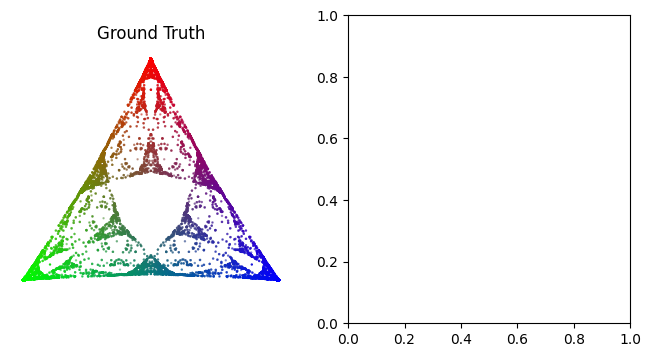

In [107]:
# РИСУЕМ
fig, axes = plt.subplots(1, 2, figsize=(8,4))

axes[0].scatter(x_gt, y_gt, s=2.0, c=colors, marker='.', rasterized=True)
axes[0].set_aspect('equal', adjustable='box'); axes[0].axis('off'); axes[0].set_title("Ground Truth")

if x_pred is not None and y_pred is not None:
    A = alpha_from_probs(gt_probs, min_alpha=0.15, mode="cbrt")
    colors = np.stack([R, G, B, A], axis=1)
    axes[1].scatter(x_pred, y_pred, s=2.0, c=colors, marker='.', rasterized=True)
    title = "Model (pred)"
    if rmse is not None:
        # rmse может быть вектором по измерениям; покажем среднее
        try:
            rmse_mean = float(np.mean(rmse))
            title += f"\nRMSE={rmse_mean:.4f}"
        except Exception:
            pass
    axes[1].set_title(title)
else:
    axes[1].text(0.5,0.5,"No predictions",ha='center',va='center'); axes[1].axis('off')

for ax in axes: ax.set_aspect('equal', adjustable='box'); ax.axis('off')
plt.tight_layout(); plt.show()

print("GT:", os.path.basename(gt_path))
print("CKPT:", os.path.basename(ckpt_path))